# D-Wave Kuantum Tavlama Servisleriyle Yapısal Dengesizlik Problemlerine İlişkin Çözümlerin Fizibilitesini İnceleme

EGE ÜNİVERSİTESİ

MÜHENDİSLİK FAKÜLTESİ

BİLGİSAYAR MÜHENDİSLİĞİ BÖLÜMÜ

2020 - 2021 ÖĞRETİM YILI

(LİSANS TEZİ)

DURSUN, EGE DOĞAN

ÇORBACIOĞLU, CEM

TEZ DANIŞMANI: DOÇ. DR. MURAT OSMAN ÜNALIR

## NetworkX Çizge Örnekleri

Bu bölümde, NetworkX kütüphanesi kullanılarak yaratılabilecek çeşitli çizgelere örnekler verilmiştir. Çalışmanın ilerleyen bölümlerinde, yine NetworkX ve D-Wave NetworkX kütüphanesi dahilinde yaratılan çizgeler kullanılarak çeşitli Yöneylem problemleri simüle edilmeye ve çözümlenmeye çalışılmıştır.

In [1]:
import networkx as nx
import matplotlib.pyplot as plt
%matplotlib inline

### Complete Graphs

/Users/egedursun/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


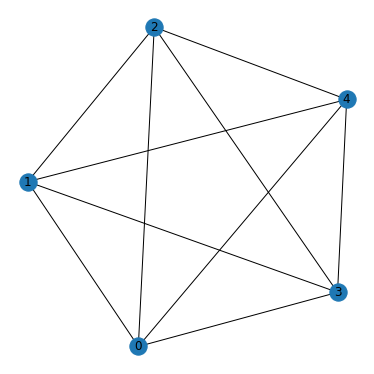

In [2]:
cg1 = nx.complete_graph(5)
plt.figure(figsize=(5,5))
nx.draw(cg1, with_labels=True, font_weights='bold')

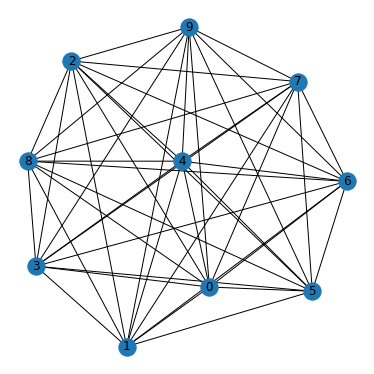

In [3]:
cg2 = nx.complete_graph(10)
plt.figure(figsize=(5,5))
nx.draw(cg2, with_labels=True, font_weights='bold')

### Balanced Tree

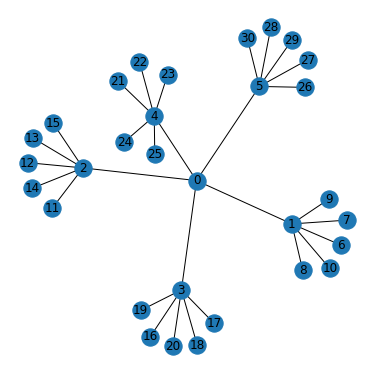

In [4]:
bt1 = nx.balanced_tree(5, 2)
plt.figure(figsize=(5,5))
nx.draw(bt1, with_labels=True, font_weights='bold')

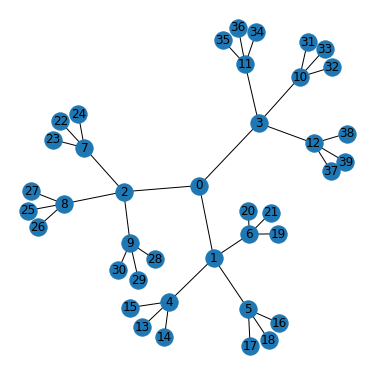

In [5]:
bt2 = nx.balanced_tree(3, 3)
plt.figure(figsize=(5,5))
nx.draw(bt2, with_labels=True, font_weights='bold')

### Barbell Graph

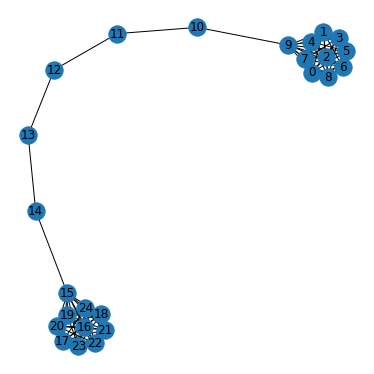

In [6]:
bg1 = nx.barbell_graph(10, 5)
plt.figure(figsize=(5,5))
nx.draw(bg1, with_labels=True, font_weights='bold')

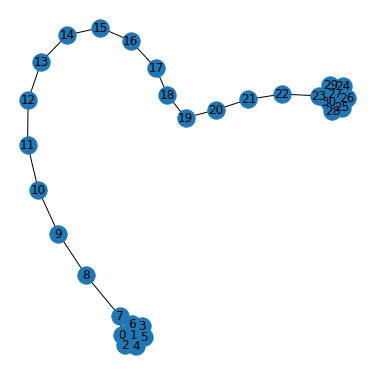

In [7]:
bg2 = nx.barbell_graph(8, 15)
plt.figure(figsize=(5,5))
nx.draw(bg2, with_labels=True, font_weights='bold')

### Circular Ladder Graph

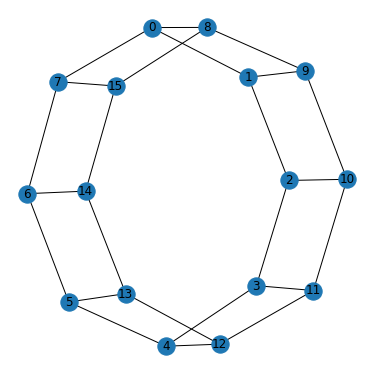

In [8]:
cl1 = nx.circular_ladder_graph(8)
plt.figure(figsize=(5,5))
nx.draw(cl1, with_labels=True, font_weights='bold')

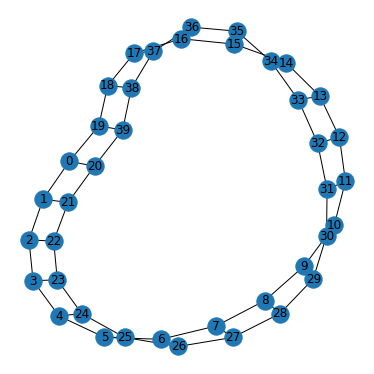

In [9]:
cl2 = nx.circular_ladder_graph(20)
plt.figure(figsize=(5,5))
nx.draw(cl2, with_labels=True, font_weights='bold')

### Cycle Graph

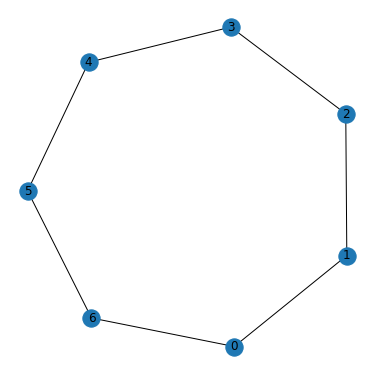

In [10]:
cyg1 = nx.cycle_graph(7)
plt.figure(figsize=(5,5))
nx.draw(cyg1, with_labels=True, font_weights='bold')

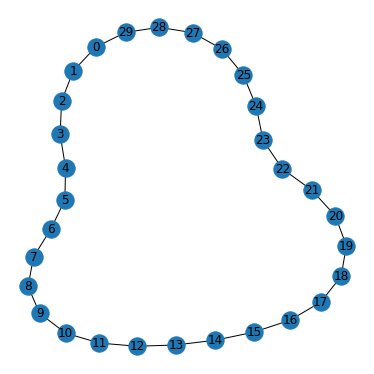

In [11]:
cyg2 = nx.cycle_graph(30)
plt.figure(figsize=(5,5))
nx.draw(cyg2, with_labels=True, font_weights='bold')

### Ladder Graph

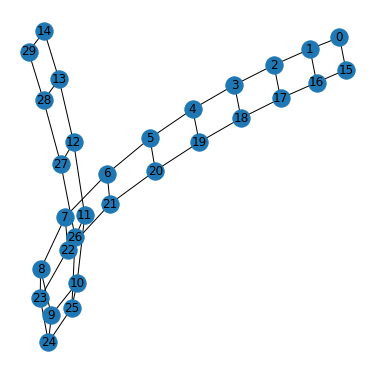

In [12]:
lag1 = nx.ladder_graph(15)
plt.figure(figsize=(5,5))
nx.draw(lag1, with_labels=True, font_weights='bold')

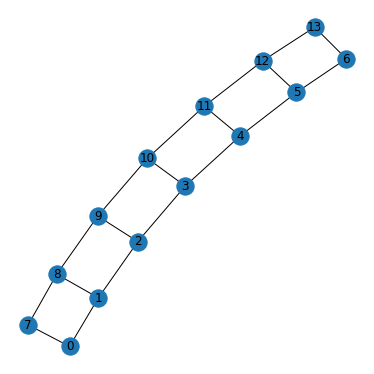

In [13]:
lag2 = nx.ladder_graph(7)
plt.figure(figsize=(5,5))
nx.draw(lag2, with_labels=True, font_weights='bold')

### Lollipop Graph

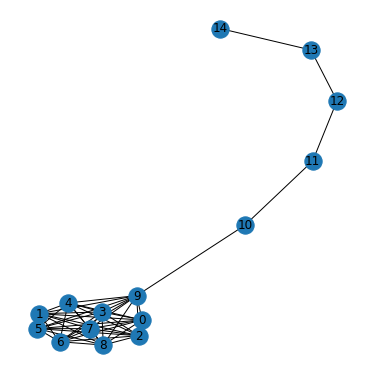

In [14]:
log1 = nx.lollipop_graph(10, 5)
plt.figure(figsize=(5,5))
nx.draw(log1, with_labels=True, font_weights='bold')

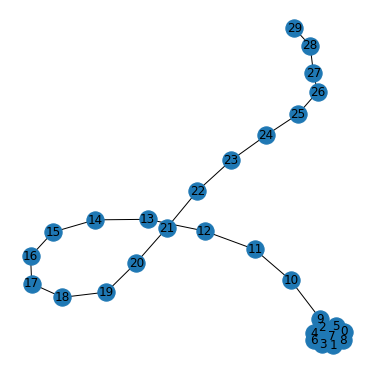

In [15]:
log2 = nx.lollipop_graph(10, 20)
plt.figure(figsize=(5,5))
nx.draw(log2, with_labels=True, font_weights='bold')

### Star Graph

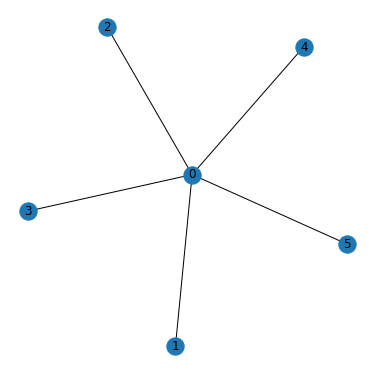

In [16]:
stg1 = nx.star_graph(5)
plt.figure(figsize=(5,5))
nx.draw(stg1, with_labels=True, font_weights='bold')

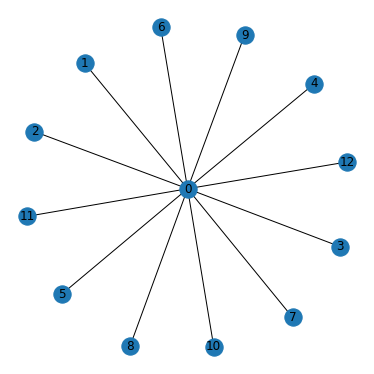

In [17]:
stg2 = nx.star_graph(12)
plt.figure(figsize=(5,5))
nx.draw(stg2, with_labels=True, font_weights='bold')

### Turan Graph

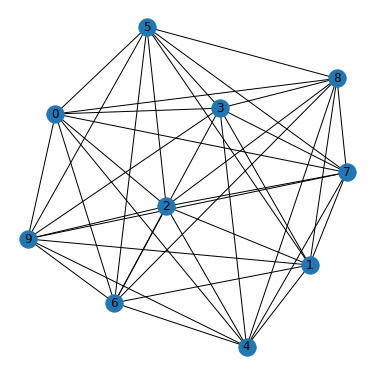

In [18]:
tr1 = nx.turan_graph(10, 5)
plt.figure(figsize=(5,5))
nx.draw(tr1, with_labels=True, font_weights='bold')

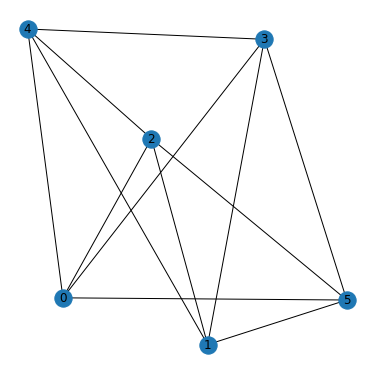

In [19]:
tr2 = nx.turan_graph(6, 3)
plt.figure(figsize=(5,5))
nx.draw(tr2, with_labels=True, font_weights='bold')

### Wheel Graph

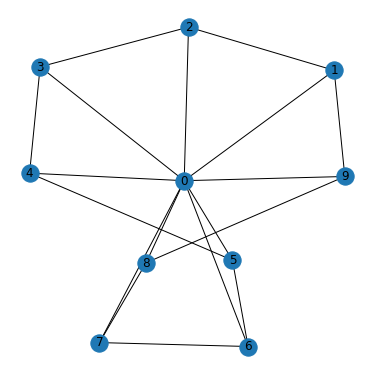

In [20]:
whg1 = nx.wheel_graph(10)
plt.figure(figsize=(5,5))
nx.draw(whg1, with_labels=True, font_weights='bold')

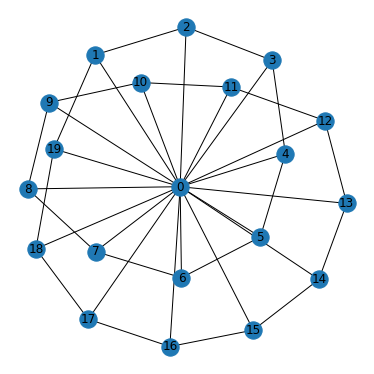

In [21]:
whg2 = nx.wheel_graph(20)
plt.figure(figsize=(5,5))
nx.draw(whg2, with_labels=True, font_weights='bold')

#### Özel Ağırlıklı Çizge Yaratmak

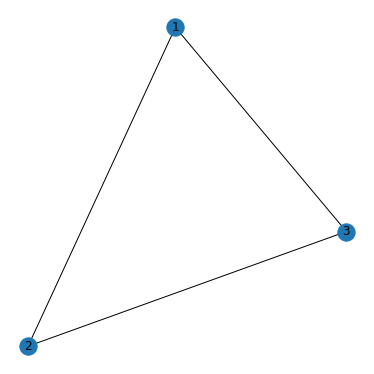

In [24]:
spec_graph = nx.Graph()
spec_graph.add_edge(1,2, weight=7)
spec_graph.add_edge(2,3, weight=9)
spec_graph.add_edge(3,1, weight=17)

plt.figure(figsize=(5,5))
nx.draw(spec_graph, with_labels=True, font_weights='bold')

## D-Wave QPU Çözümleyiciler ile Çeşitli Problemlerin Çözümlenmesi

Bu bölümde NetworkX kütüphanesi kullanılarak yaratılmış çizgeler ile ifade edilen problemleri, D-Wave'in bulut üzerinden sunduğu Kuantum Tavlama servisleri ile çözümlemeye çalıştık. QPU ile elde ettiğimiz sonuçları, CPU performansı ile kıyaslayarak farklarını raporlandırdık.

In [48]:
#CPU Çözümleyicisinin import edilmesi
from dimod.reference.samplers import ExactSolver

#QPU Çözümleyicisinin import edilmesi
from dwave.system.samplers import DWaveSampler

from dwave.system.composites import EmbeddingComposite
import dwave_networkx as dnx

import time
import random

In [49]:
#CPU çözümleyicisini yarat
cpu_sampler = ExactSolver()

#QPU çözümleyicisini yarat
qpu_sampler = EmbeddingComposite(DWaveSampler())

### Minimum Vertex Cover Problemi

#### Birinci Problem

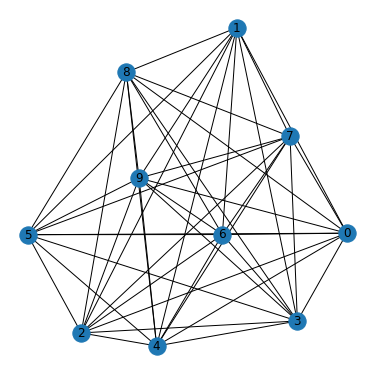

In [30]:
vcv1 = nx.complete_graph(10)

#Bağlantıların ağırlıklarının rastgele belirlenmesi 
for (u,v,w) in vcv1.edges(data=True):
    w['weight'] = random.randint(0,20)

    
plt.figure(figsize=(5,5))
nx.draw(vcv1, with_labels=True, font_weights='bold')

#### İkinci Problem

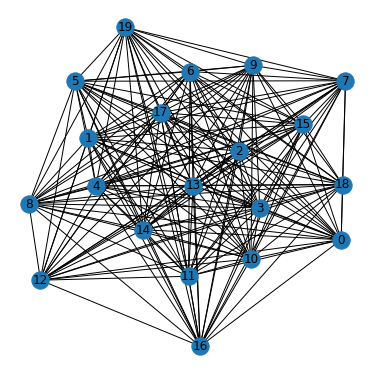

In [31]:
vcv2 = nx.complete_graph(20)

for (u,v,w) in vcv2.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(vcv2, with_labels=True, font_weights='bold')

#### Üçüncü Problem

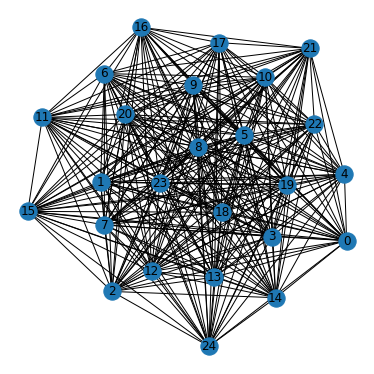

In [32]:
vcv3 = nx.complete_graph(25)

for (u,v,w) in vcv3.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(vcv3, with_labels=True, font_weights='bold')

#### Birinci Problem - QPU ile Çözümleme

In [33]:
q_start = time.time()

qpu_result_a = dnx.min_vertex_cover(vcv1, qpu_sampler)

q_end = time.time()

qpu_result_time = (q_end - q_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ",qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.6201417446136475


#### Birinci Problem - CPU ile Çözümleme

In [34]:
c_start = time.time()

cpu_result_a = dnx.min_vertex_cover(vcv1, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("1. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

1. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.004764080047607422


#### İkinci Problem - QPU ile Çözümleme

In [35]:
q_start = time.time()

qpu_result_b = dnx.min_vertex_cover(vcv2, qpu_sampler)

q_end = time.time()

qpu_result_time = (q_end - q_start)

print("2. PROBLEM - QPU ÇÖZÜM SÜRESİ: ",qpu_result_time)

2. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.60565972328186


#### İkinci Problem - CPU ile Çözümleme

In [36]:
c_start = time.time()

cpu_result_b = dnx.min_vertex_cover(vcv2, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("2. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

2. PROBLEM - CPU ÇÖZÜM SÜRESİ:  3.043724775314331


#### Üçüncü Problem - QPU ile Çözümleme

In [37]:
q_start = time.time()

qpu_result = dnx.min_vertex_cover(vcv3, qpu_sampler)

q_end = time.time()

qpu_result_time = (q_end - q_start)

print("3. PROBLEM - QPU ÇÖZÜM SÜRESİ: ",qpu_result_time)

3. PROBLEM - QPU ÇÖZÜM SÜRESİ:  7.12906289100647


#### Üçüncü Problem - CPU ile Çözümleme

In [38]:
c_start = time.time()

cpu_result = dnx.min_vertex_cover(vcv3, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("3. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

3. PROBLEM - CPU ÇÖZÜM SÜRESİ:  220.4924087524414


#### Birinci Problem - Çözümlerin Karşılaştırılması

In [39]:
print("1. PROBLEM - QPU SONUÇ: ", qpu_result_a)
print("1. PROBLEM - CPU SONUÇ: ", cpu_result_a)

1. PROBLEM - QPU SONUÇ:  [1, 2, 3, 4, 5, 7, 8, 9]
1. PROBLEM - CPU SONUÇ:  [0, 1, 2, 3, 4, 5, 6, 7, 9]


#### İkinci Problem - Çözümlerin Karşılaştırılması

In [40]:
print("2. PROBLEM - QPU SONUÇ: ", qpu_result_b)
print("2. PROBLEM - CPU SONUÇ: ", cpu_result_b)

2. PROBLEM - QPU SONUÇ:  [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 16]
2. PROBLEM - CPU SONUÇ:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 19]


#### Üçüncü Problem - Çözümlerin Karşılaştırılması

In [41]:
print("3. PROBLEM - QPU SONUÇ: ", qpu_result)
print("3. PROBLEM - CPU SONUÇ: ", cpu_result)

3. PROBLEM - QPU SONUÇ:  [2, 3, 4, 5, 6, 8, 9, 12, 14, 15, 16, 17, 19, 21, 24]
3. PROBLEM - CPU SONUÇ:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 24]


# =============================================================

##### CPU GECİKMESİNİ ETKİLEYEN FAKTÖRLER: 
- CPU FREKANSI
- CPU ÇEKİRDEK SAYISI
- RAM BOYUTU
 
 
##### QPU GECİKMESİNİ ETKİLEYEN FAKTÖRLER:
- HTTP REQUEST İLETİM GECİKMESİ 
- HTTP RESPONSE İLETİM GECİKMESİ



# =============================================================
 
 
 | N (nod-sayısı)  |  CPU gecikmesi (saniye) | QPU gecikmesi (saniye)  |
 |---|---|---|
 | 1   |  0.0  |   2.37    |
 | 2   |  0.49     |  1.92     |
 | 3   |  0.0     |   1.90    |
 | 4   |  0.0     |   1.90    |
 | 5   |  0.0     |  1.91     |
 | 6   |  0.1     |   1.91    |
 | 7   | 0.0      |   1.92    |
 | 8   |  0.0     |   1.95    |
 | 9   |  0.0     |   1.95    |
 | 10  |   0.2    |   2.00    |
 | 11  |  0.3     |   2.12    |
 | 12  |   0.64    |  2.06     |
 | 13  |  0.15     |    2.04   |
 | 14  |  0.26     |   2.08    |
 | 15  |   0.37    |   2.21    |
 | 16  |  0.83     |    2.19   |
 | 17  |   1.91    |   2.19    |
 | 18  |   3.37    |   2.40    |
 | 19  |  7.26     |   2.53    |
 | 20  | 13.8  | 2.42  |
 | 21  | 28.6  | 2.86  |
 | 22  | 56.1  | 2.76  |
 | 23  |   120.4    |   2.32    |
 |  24  |   253.5    |  2.12     |
 |  25   | 508.2      |   2.82    |
 |    26 |   1103.7    |   2.87    |
 |   27  |  2343.2     |  1.92     |

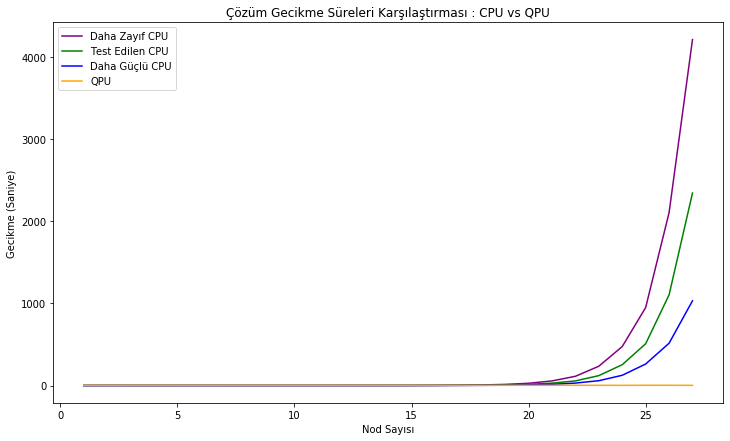

In [71]:
dot_amount = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27]


weaker_cpu_latency = [0.0, 0.0, 0.0, 0.0, 0.0, 0.1, 0.01, 0.00, 0.02, 0.01, 0.05, 0.08, 0.14, 0.32, 0.72, 1.47, 3.12, 6.84, 13.48, 27.11, 55.84,
                     112.27, 234.89, 474.39,  949.23, 2104.35, 4211.43]

cpu_latency = [0.0, 0.49, 0.0, 0.0, 0.0, 0.1, 0.0, 0.0, 0.0, 0.2, 0.3, 0.64, 0.15, 0.26, 0.37, 0.83, 1.91, 3.37, 7.26,
              13.8, 28.6, 56.1, 120.4, 253.5, 508.2, 1103.7, 2343.2]

stronger_cpu_latency = [0.0, 0.0, 0.0, 0.01, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0 , 0.0, 0.01, 0.2, 0.11, 0.3, 0.63, 0.88,
                       1.82, 3.39, 8.21, 14.3, 29.54, 58.5, 124.5, 261.7, 514.7, 1031.14]

qpu_latency = [2.37, 1.92, 1.90, 1.90, 1.91, 1.91, 1.92, 1.95, 1.95, 2.00, 2.12, 2.06, 2.04, 2.08, 2.21, 2.19, 2.19,
              2.40, 2.53, 2.42, 2.86, 2.76, 2.32, 2.12, 2.82, 2.87, 1.92]

plt.figure(figsize=(12,7))
plt.plot(dot_amount, weaker_cpu_latency, color="purple")
plt.plot(dot_amount, cpu_latency, color='g')
plt.plot(dot_amount, stronger_cpu_latency, color="blue")
plt.plot(dot_amount, qpu_latency, color='orange')
plt.xlabel('Nod Sayısı')
plt.ylabel('Gecikme (Saniye)')
plt.title('Çözüm Gecikme Süreleri Karşılaştırması : CPU vs QPU')
plt.legend(['Daha Zayıf CPU','Test Edilen CPU', 'Daha Güçlü CPU', 'QPU'])
plt.show()

### Map Coloring Problemi

#### Birinci Problem

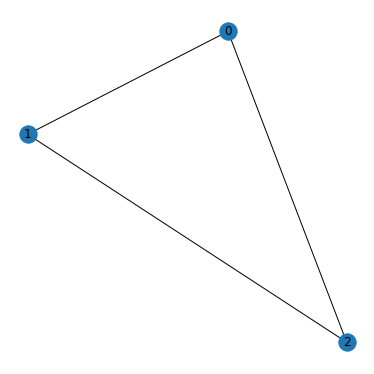

In [57]:
mcv1 = nx.complete_graph(3)

for (u,v,w) in mcv1.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mcv1, with_labels=True, font_weights='bold')

#### İkinci Problem

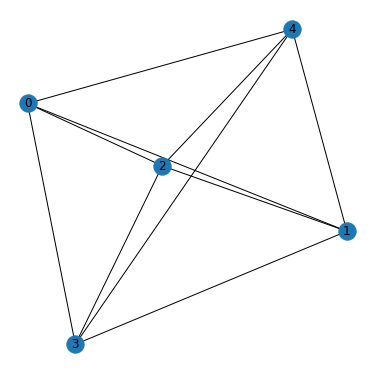

In [58]:
mcv2 = nx.complete_graph(5)

for (u,v,w) in mcv2.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mcv2, with_labels=True, font_weights='bold')

#### Üçüncü Problem

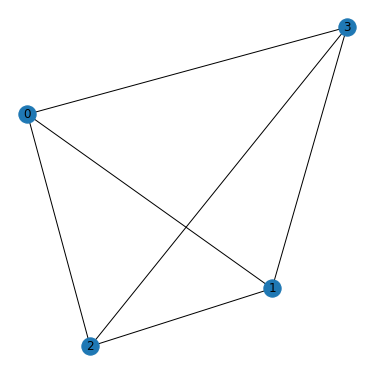

In [76]:
mcv3 = nx.complete_graph(4)

for (u,v,w) in mcv3.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mcv3, with_labels=True, font_weights='bold')

#### Birinci Problem - QPU ile Çözümleme

In [64]:
c_start = time.time()

qpu_result_a = dnx.min_vertex_color(mcv1, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.169461011886597


#### Birinci Problem - CPU ile Çözümleme

In [65]:
c_start = time.time()

cpu_result_a = dnx.min_vertex_color(mcv1, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("1. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

1. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.0037550926208496094


#### İkinci Problem - QPU ile Çözümleme

In [601]:
c_start = time.time()

qpu_result_b = dnx.min_vertex_color(mcv2, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)


print("2. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

2. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.625643014907837


#### İkinci Problem - CPU ile Çözümleme

In [602]:
c_start = time.time()

cpu_result_b = dnx.min_vertex_color(mcv2, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("2. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

2. PROBLEM - CPU ÇÖZÜM SÜRESİ:  110.11295008659363


#### Üçüncü Problem - QPU ile Çözümleme

In [600]:
c_start = time.time()

qpu_result = dnx.min_vertex_color(mcv3, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("3. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

3. PROBLEM - QPU ÇÖZÜM SÜRESİ:  7.305860757827759


#### Üçüncü Problem - CPU ile Çözümleme

In [78]:
c_start = time.time()

cpu_result = dnx.min_vertex_color(mcv3, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("3. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

3. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.11782503128051758


#### Birinci Problem - Çözümlerin Karşılaştırılması

In [79]:
print("1. PROBLEM - QPU SONUÇ: ", qpu_result_a)
print("1. PROBLEM - CPU SONUÇ: ", cpu_result_a)

1. PROBLEM - QPU SONUÇ:  {0: 0, 1: 1, 2: 2}
1. PROBLEM - CPU SONUÇ:  {0: 2, 1: 0, 2: 1}


#### İkinci Problem - Çözümlerin Karşılaştırılması

In [603]:
print("2. PROBLEM - QPU SONUÇ: ", qpu_result_b)
print("2. PROBLEM - CPU SONUÇ: ", cpu_result_b)

2. PROBLEM - QPU SONUÇ:  {0: 2, 1: 3, 2: 0, 3: 1, 4: 4}
2. PROBLEM - CPU SONUÇ:  {0: 3, 1: 4, 2: 1, 3: 2, 4: 0}


#### Üçüncü Problem - Çözümlerin Karşılaştırılması

In [81]:
print("3. PROBLEM - QPU SONUÇ: ", qpu_result)
print("3. PROBLEM - CPU SONUÇ: ", cpu_result)

1. PROBLEM - QPU SONUÇ:  {0: 2, 2: 0, 3: 2}
1. PROBLEM - CPU SONUÇ:  {0: 1, 1: 2, 2: 0, 3: 3}


### Maximum Clique Problemi

#### Birinci Problem

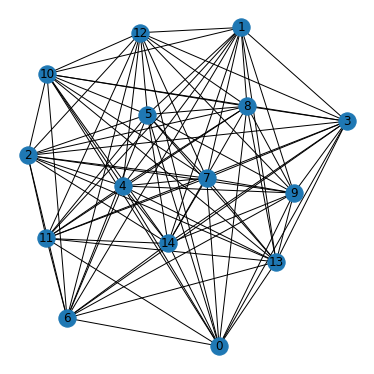

In [121]:
mxc1 = nx.turan_graph(15, 5)

for (u,v,w) in mxc1.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mxc1, with_labels=True, font_weights='bold')

#### İkinci Problem

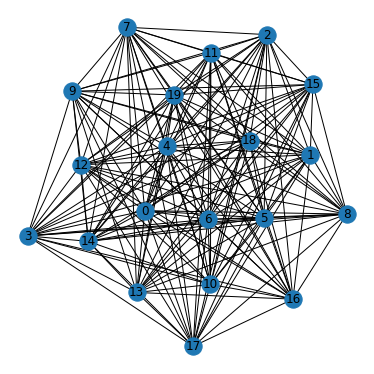

In [125]:
mxc2 = nx.turan_graph(20, 8)

for (u,v,w) in mxc2.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mxc2, with_labels=True, font_weights='bold')

#### Üçüncü Problem

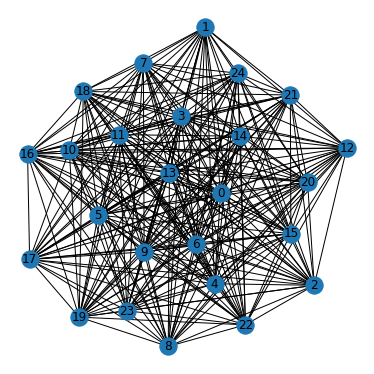

In [126]:
mxc3 = nx.turan_graph(25, 13)

for (u,v,w) in mxc3.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mxc3, with_labels=True, font_weights='bold')

#### Birinci Problem - QPU ile Çözümleme

In [604]:
c_start = time.time()

qpu_result_a = dnx.maximum_clique(mxc1, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  4.724148988723755


#### Birinci Problem - CPU ile Çözümleme

In [605]:
c_start = time.time()

cpu_result_a = dnx.maximum_clique(mxc1, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("1. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

1. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.06234598159790039


#### İkinci Problem - QPU ile Çözümleme 

In [606]:
c_start = time.time()

qpu_result_b = dnx.maximum_clique(mxc2, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("2. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

2. PROBLEM - QPU ÇÖZÜM SÜRESİ:  4.968411922454834


#### İkinci Problem - CPU ile Çözümleme

In [607]:
c_start = time.time()

cpu_result_b = dnx.maximum_clique(mxc2, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("2. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

2. PROBLEM - CPU ÇÖZÜM SÜRESİ:  1.8269367218017578


#### Üçüncü Problem - QPU ile Çözümleme

In [608]:
c_start = time.time()

qpu_result = dnx.maximum_clique(mxc3, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("3. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

3. PROBLEM - QPU ÇÖZÜM SÜRESİ:  3.9754130840301514


#### Üçüncü Problem - CPU ile Çözümleme

In [612]:
c_start = time.time()

cpu_result = dnx.maximum_clique(mxc3, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("3. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

3. PROBLEM - CPU ÇÖZÜM SÜRESİ:  57.896332025527954


#### Birinci Problem - Çözümlerin Karşılaştırılması

In [609]:
print("1. PROBLEM - QPU SONUÇ: ", qpu_result_a)
print("1. PROBLEM - CPU SONUÇ: ", cpu_result_a)

1. PROBLEM - QPU SONUÇ:  [1, 5, 8, 10, 14]
1. PROBLEM - CPU SONUÇ:  [2, 3, 7, 9, 12]


#### İkinci Problem - Çözümlerin Karşılaştırılması

In [610]:
print("2. PROBLEM - QPU SONUÇ: ", qpu_result_b)
print("2. PROBLEM - CPU SONUÇ: ", cpu_result_b)

2. PROBLEM - QPU SONUÇ:  [0, 2, 4, 6, 10, 12, 14, 18]
2. PROBLEM - CPU SONUÇ:  [1, 3, 4, 7, 10, 11, 16, 18]


#### Üçüncü Problem - Çözümlerin Karşılaştırılması

In [613]:
print("3. PROBLEM - QPU SONUÇ: ", qpu_result)
print("3. PROBLEM - CPU SONUÇ: ", cpu_result)

3. PROBLEM - QPU SONUÇ:  [0, 2, 3, 5, 8, 9, 11, 13, 16, 18, 20, 22, 23]
3. PROBLEM - CPU SONUÇ:  [0, 2, 4, 5, 7, 10, 11, 13, 16, 17, 20, 22, 23]


### Minimum Maximal Matching Problemi

#### Birinci Problem

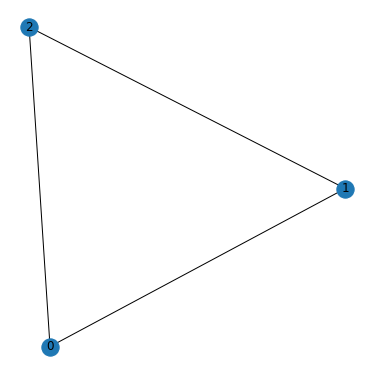

In [156]:
mmm1 = nx.complete_graph(3)

for (u,v,w) in mmm1.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mmm1, with_labels=True, font_weights='bold')

#### İkinci Problem

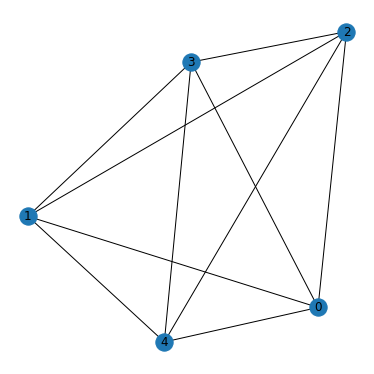

In [157]:
mmm2 = nx.complete_graph(5)

for (u,v,w) in mmm2.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mmm2, with_labels=True, font_weights='bold')

#### Üçüncü Problem

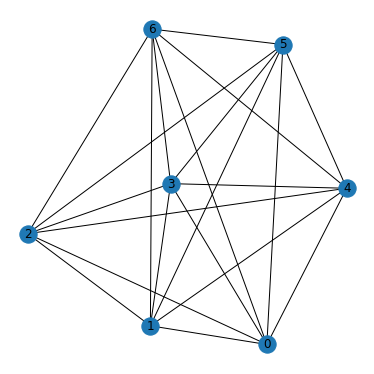

In [158]:
mmm3 = nx.complete_graph(7)

for (u,v,w) in mmm3.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mmm3, with_labels=True, font_weights='bold')

#### Birinci Problem - QPU ile Çözümleme

In [159]:
c_start = time.time()

qpu_result_a = dnx.min_maximal_matching(mmm1, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.174998998641968


#### Birinci Problem - CPU ile Çözümleme

In [160]:
c_start = time.time()

cpu_result_a = dnx.min_maximal_matching(mmm1, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("1. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

1. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.0010380744934082031


#### İkinci Problem - QPU ile Çözümleme

In [161]:
c_start = time.time()

qpu_result_b = dnx.min_maximal_matching(mmm2, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("2. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

2. PROBLEM - QPU ÇÖZÜM SÜRESİ:  6.901879787445068


#### İkinci Problem - CPU ile Çözümleme

In [162]:
c_start = time.time()

cpu_result_b = dnx.min_maximal_matching(mmm2, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("2. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

2. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.006217002868652344


#### Üçüncü Problem - QPU ile Çözümleme

In [163]:
c_start = time.time()

qpu_result = dnx.min_maximal_matching(mmm3, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("3. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

3. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.537613153457642


#### Üçüncü Problem - CPU ile Çözümleme

In [164]:
c_start = time.time()

cpu_result = dnx.min_maximal_matching(mmm3, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("3. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

3. PROBLEM - CPU ÇÖZÜM SÜRESİ:  9.340500116348267


#### Birinci Problem - Çözümlerin Karşılaştırılması

In [165]:
print("1. PROBLEM - QPU SONUÇ: ", qpu_result_a)
print("1. PROBLEM - CPU SONUÇ: ", cpu_result_a)

1. PROBLEM - QPU SONUÇ:  {(0, 2)}
1. PROBLEM - CPU SONUÇ:  {(0, 1)}


#### İkinci Problem - Çözümlerin Karşılaştırılması

In [166]:
print("2. PROBLEM - QPU SONUÇ: ", qpu_result_b)
print("2. PROBLEM - CPU SONUÇ: ", cpu_result_b)

2. PROBLEM - QPU SONUÇ:  {(0, 1), (1, 3), (0, 2), (2, 4)}
2. PROBLEM - CPU SONUÇ:  {(1, 2), (0, 3)}


#### Üçüncü Problem - Çözümlerin Karşılaştırılması

In [167]:
print("3. PROBLEM - QPU SONUÇ: ", qpu_result)
print("3. PROBLEM - CPU SONUÇ: ", cpu_result)

3. PROBLEM - QPU SONUÇ:  {(1, 5), (0, 2), (1, 4), (0, 4)}
3. PROBLEM - CPU SONUÇ:  {(1, 5), (4, 6), (0, 2)}


### Maximum Cut Problemi

#### Birinci Problem

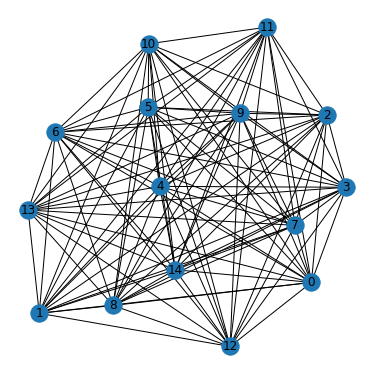

In [194]:
mxcut1 = nx.complete_graph(15)

for (u,v,w) in mxcut1.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mxcut1, with_labels=True, font_weights='bold')

#### İkinci Problem

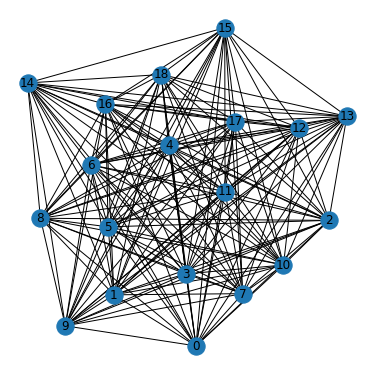

In [195]:
mxcut2 = nx.complete_graph(19)

for (u,v,w) in mxcut2.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mxcut2, with_labels=True, font_weights='bold')

#### Üçüncü Problem

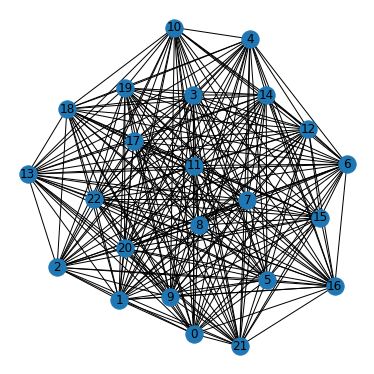

In [196]:
mxcut3 = nx.complete_graph(23)

for (u,v,w) in mxcut3.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(mxcut3, with_labels=True, font_weights='bold')

#### Birinci Problem - QPU ile Çözümleme

In [197]:
c_start = time.time()

qpu_result_a = dnx.maximum_cut(mxcut1, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.048703193664551


#### Birinci Problem - CPU ile Çözümleme

In [198]:
c_start = time.time()

cpu_result_a = dnx.maximum_cut(mxcut1, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("1. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

1. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.09636402130126953


#### İkinci Problem - QPU ile Çözümleme

In [199]:
c_start = time.time()

qpu_result_b = dnx.maximum_cut(mxcut2, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("2. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

2. PROBLEM - QPU ÇÖZÜM SÜRESİ:  7.465651988983154


#### İkinci Problem - CPU ile Çözümleme

In [200]:
c_start = time.time()

cpu_result_b = dnx.maximum_cut(mxcut2, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("2. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

2. PROBLEM - CPU ÇÖZÜM SÜRESİ:  1.466797113418579


#### Üçüncü Problem - QPU ile Çözümleme

In [201]:
c_start = time.time()

qpu_result = dnx.maximum_cut(mxcut3, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("3. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

3. PROBLEM - QPU ÇÖZÜM SÜRESİ:  4.111576080322266


#### Üçüncü Problem - CPU ile Çözümleme

In [202]:
c_start = time.time()

cpu_result = dnx.maximum_cut(mxcut3, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("3. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

3. PROBLEM - CPU ÇÖZÜM SÜRESİ:  46.15278220176697


#### Birinci Problem - Çözümlerin Karşılaştırılması

In [203]:
print("1. PROBLEM - QPU SONUÇ: ", qpu_result_a)
print("1. PROBLEM - CPU SONUÇ: ", cpu_result_a)

1. PROBLEM - QPU SONUÇ:  {1, 4, 6, 10, 11, 12, 14}
1. PROBLEM - CPU SONUÇ:  {0, 3, 4, 5, 7, 10, 13}


#### İkinci Problem - Çözümlerin Karşılaştırılması

In [204]:
print("2. PROBLEM - QPU SONUÇ: ", qpu_result_b)
print("2. PROBLEM - CPU SONUÇ: ", cpu_result_b)

2. PROBLEM - QPU SONUÇ:  {0, 1, 4, 6, 7, 8, 14, 15}
2. PROBLEM - CPU SONUÇ:  {1, 2, 3, 4, 10, 11, 13, 15, 16, 17}


#### Üçüncü Problem - Çözümlerin Karşılaştırılması

In [205]:
print("3. PROBLEM - QPU SONUÇ: ", qpu_result)
print("3. PROBLEM - CPU SONUÇ: ", cpu_result)

3. PROBLEM - QPU SONUÇ:  {0, 1, 4, 6, 7, 8, 11, 15, 17, 18, 19, 22}
3. PROBLEM - CPU SONUÇ:  {0, 5, 7, 10, 12, 13, 15, 18, 19, 20, 21}


### Traveling Salesperson Problemi

#### Birinci Problem

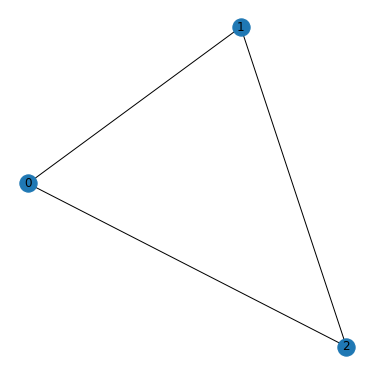

In [217]:
tsp1 = nx.complete_graph(3)

for (u,v,w) in tsp1.edges(data=True):
    w['weight'] = random.randint(10,50)

plt.figure(figsize=(5,5))
nx.draw(tsp1, with_labels=True, font_weights='bold')

#### İkinci Problem

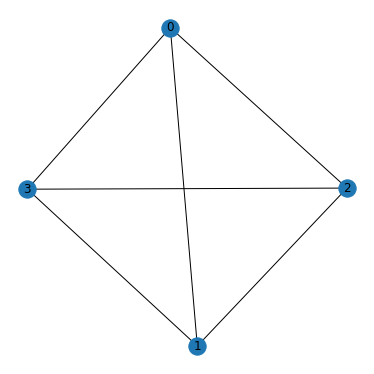

In [219]:
tsp2 = nx.complete_graph(4)

for (u,v,w) in tsp2.edges(data=True):
    w['weight'] = random.randint(10,50)

plt.figure(figsize=(5,5))
nx.draw(tsp2, with_labels=True, font_weights='bold')

#### Üçüncü Problem

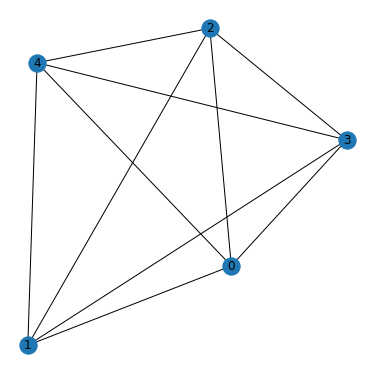

In [220]:
tsp3 = nx.complete_graph(5)

for (u,v,w) in tsp3.edges(data=True):
    w['weight'] = random.randint(10,50)

plt.figure(figsize=(5,5))
nx.draw(tsp3, with_labels=True, font_weights='bold')

#### Birinci Problem - QPU ile Çözümleme

In [221]:
c_start = time.time()

qpu_result_a = dnx.traveling_salesperson(tsp1, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.453104019165039


#### Birinci Problem - CPU ile Çözümleme

In [222]:
c_start = time.time()

cpu_result_a = dnx.traveling_salesperson(tsp1, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("1. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

1. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.003008127212524414


#### İkinci Problem - QPU ile Çözümleme

In [223]:
c_start = time.time()

qpu_result_b = dnx.traveling_salesperson(tsp2, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("2. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

2. PROBLEM - QPU ÇÖZÜM SÜRESİ:  6.469345808029175


#### İkinci Problem - CPU ile Çözümleme

In [224]:
c_start = time.time()

cpu_result_b = dnx.traveling_salesperson(tsp2, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("2. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

2. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.15728998184204102


#### Üçüncü Problem - QPU ile Çözümleme

In [225]:
c_start = time.time()

qpu_result = dnx.traveling_salesperson(tsp3, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("3. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

3. PROBLEM - QPU ÇÖZÜM SÜRESİ:  8.27685022354126


#### Üçüncü Problem - CPU ile Çözümleme

In [226]:
c_start = time.time()

cpu_result = dnx.traveling_salesperson(tsp3, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("3. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

3. PROBLEM - CPU ÇÖZÜM SÜRESİ:  184.03486275672913


#### Birinci Problem - Çözümlerin Karşılaştırılması

In [227]:
print("1. PROBLEM - QPU SONUÇ: ", qpu_result_a)
print("1. PROBLEM - CPU SONUÇ: ", cpu_result_a)

1. PROBLEM - QPU SONUÇ:  [1, 1, 1]
1. PROBLEM - CPU SONUÇ:  [0, 1, 2]


#### İkinci Problem - Çözümlerin Karşılaştırılması

In [228]:
print("2. PROBLEM - QPU SONUÇ: ", qpu_result_b)
print("2. PROBLEM - CPU SONUÇ: ", cpu_result_b)

2. PROBLEM - QPU SONUÇ:  [None, None, None, 3]
2. PROBLEM - CPU SONUÇ:  [3, 1, 0, 2]


#### Üçüncü Problem - Çözümlerin Karşılaştırılması

In [229]:
print("3. PROBLEM - QPU SONUÇ: ", qpu_result)
print("3. PROBLEM - CPU SONUÇ: ", cpu_result)

3. PROBLEM - QPU SONUÇ:  [1, 2, 1, 2, None]
3. PROBLEM - CPU SONUÇ:  [0, 1, 2, 3, 4]


### Structural Imbalance Problemi

#### Birinci Problem

In [261]:
sim1 = nx.complete_graph(5)
sim1.add_edges_from([(u, v, {'sign': 2*random.randint(0, 1) - 1}) for u, v in sim1.edges])

nx.relabel_nodes(sim1, 
                 {0: 'Ayse', 1: 'Baris', 2: 'Ceren', 3: 'Deniz', 4:'Eda'}, 
                 copy=False)

print('Pozitif (Arkadaşcıl) İlişkiler: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y, sign) in sim1.edges(data='sign') if (sign == 1))))
print('Negatif (Düşmancıl) İlişkiler: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y, sign) in sim1.edges(data='sign') if (sign == -1))))

Pozitif (Arkadaşcıl) İlişkiler: 
	Ayse & Ceren
	Baris & Ceren
	Ceren & Deniz
Negatif (Düşmancıl) İlişkiler: 
	Ayse & Baris
	Ayse & Deniz
	Ayse & Eda
	Baris & Deniz
	Baris & Eda
	Ceren & Eda
	Deniz & Eda


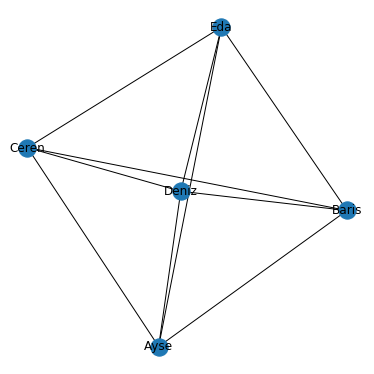

In [262]:
plt.figure(figsize=(5,5))
nx.draw(sim1, with_labels=True, font_weights='bold')

#### İkinci Problem

In [263]:
sim2 = nx.complete_graph(15)
sim2.add_edges_from([(u, v, {'sign': 2*random.randint(0, 1) - 1}) for u, v in sim2.edges])

nx.relabel_nodes(sim2, 
                 {0: 'Ayse', 1: 'Baris', 2: 'Ceren', 3: 'Deniz', 4:'Eda', 5:'Fahrettin', 6:'Gaye',
                 7: 'Hulya', 8: 'İdil', 9:'Jale', 10:'Kadir', 11:'Lale', 12:'Melis', 13:'Nedim', 14:'Onur'}, 
                 copy=False)

print('Pozitif (Arkadaşcıl) İlişkiler: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y, sign) in sim2.edges(data='sign') if (sign == 1))))
print('Negatif (Düşmancıl) İlişkiler: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y, sign) in sim2.edges(data='sign') if (sign == -1))))

Pozitif (Arkadaşcıl) İlişkiler: 
	Ayse & Baris
	Ayse & Deniz
	Ayse & Eda
	Ayse & Gaye
	Ayse & Hulya
	Ayse & Melis
	Ayse & Nedim
	Baris & Ceren
	Baris & Deniz
	Baris & Fahrettin
	Baris & Gaye
	Baris & Hulya
	Baris & Melis
	Baris & Onur
	Ceren & Deniz
	Ceren & Fahrettin
	Ceren & Hulya
	Ceren & İdil
	Ceren & Kadir
	Ceren & Lale
	Ceren & Nedim
	Ceren & Onur
	Deniz & Hulya
	Deniz & Jale
	Deniz & Nedim
	Deniz & Onur
	Eda & Fahrettin
	Eda & Hulya
	Eda & İdil
	Eda & Lale
	Eda & Melis
	Fahrettin & Gaye
	Gaye & Hulya
	Gaye & İdil
	Gaye & Lale
	Gaye & Onur
	Hulya & İdil
	Hulya & Jale
	Hulya & Lale
	Hulya & Melis
	Hulya & Onur
	İdil & Jale
	İdil & Melis
	Jale & Kadir
	Jale & Melis
	Jale & Nedim
	Kadir & Lale
	Lale & Melis
	Lale & Nedim
	Melis & Onur
	Nedim & Onur
Negatif (Düşmancıl) İlişkiler: 
	Ayse & Ceren
	Ayse & Fahrettin
	Ayse & İdil
	Ayse & Jale
	Ayse & Kadir
	Ayse & Lale
	Ayse & Onur
	Baris & Eda
	Baris & İdil
	Baris & Jale
	Baris & Kadir
	Baris & Lale
	Baris & Nedim
	Ceren & Eda
	Ceren & G

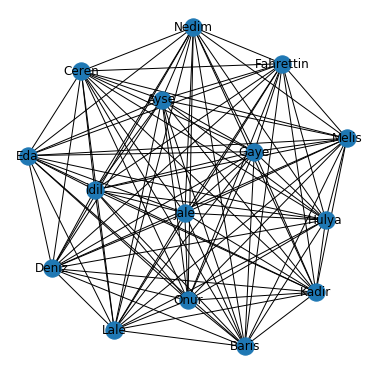

In [264]:
plt.figure(figsize=(5,5))
nx.draw(sim2, with_labels=True, font_weights='bold')

#### Üçüncü Problem

In [265]:
sim3 = nx.complete_graph(25)
sim3.add_edges_from([(u, v, {'sign': 2*random.randint(0, 1) - 1}) for u, v in sim3.edges])

nx.relabel_nodes(sim3, 
                 {0: 'Ayse', 1: 'Baris', 2: 'Ceren', 3: 'Deniz', 4:'Eda', 5:'Fahrettin', 6:'Gaye',
                 7: 'Hulya', 8: 'İdil', 9:'Jale', 10:'Kadir', 11:'Lale', 12:'Melis', 13:'Nedim', 14:'Onur',
                 15: 'Pelin', 16:'Rasim', 17:'Selin', 18:'Tolga', 19:'Ulvi', 20:'Volkan', 21:'Yavuz',
                 22: 'Zeliha', 23:'Anıl', 24:'Beril'}, 
                 copy=False)

print('Pozitif (Arkadaşcıl) İlişkiler: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y, sign) in sim3.edges(data='sign') if (sign == 1))))
print('Negatif (Düşmancıl) İlişkiler: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y, sign) in sim3.edges(data='sign') if (sign == -1))))

Pozitif (Arkadaşcıl) İlişkiler: 
	Ayse & Eda
	Ayse & Fahrettin
	Ayse & Hulya
	Ayse & İdil
	Ayse & Jale
	Ayse & Kadir
	Ayse & Lale
	Ayse & Nedim
	Ayse & Pelin
	Ayse & Ulvi
	Ayse & Volkan
	Ayse & Anıl
	Ayse & Beril
	Baris & Ceren
	Baris & Eda
	Baris & İdil
	Baris & Lale
	Baris & Nedim
	Baris & Pelin
	Baris & Rasim
	Baris & Tolga
	Baris & Ulvi
	Baris & Yavuz
	Baris & Zeliha
	Baris & Anıl
	Baris & Beril
	Ceren & Deniz
	Ceren & Fahrettin
	Ceren & Gaye
	Ceren & Hulya
	Ceren & İdil
	Ceren & Jale
	Ceren & Kadir
	Ceren & Lale
	Ceren & Onur
	Ceren & Rasim
	Ceren & Zeliha
	Ceren & Beril
	Deniz & İdil
	Deniz & Onur
	Deniz & Rasim
	Deniz & Selin
	Deniz & Ulvi
	Deniz & Volkan
	Deniz & Anıl
	Deniz & Beril
	Eda & Fahrettin
	Eda & İdil
	Eda & Jale
	Eda & Kadir
	Eda & Lale
	Eda & Onur
	Eda & Pelin
	Eda & Rasim
	Eda & Ulvi
	Eda & Volkan
	Eda & Yavuz
	Eda & Zeliha
	Eda & Anıl
	Fahrettin & Gaye
	Fahrettin & Lale
	Fahrettin & Pelin
	Fahrettin & Rasim
	Fahrettin & Selin
	Fahrettin & Ulvi
	Fahrettin & Yavuz
	

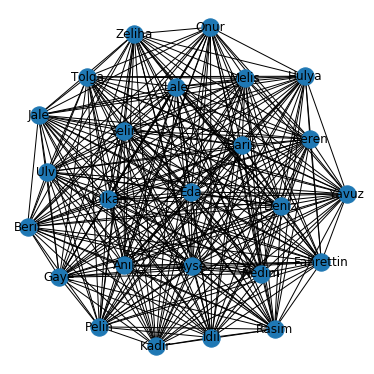

In [266]:
plt.figure(figsize=(5,5))
nx.draw(sim3, with_labels=True, font_weights='bold')

#### Birinci Problem - QPU ile Çözümleme

In [274]:
c_start = time.time()

qpu_imbalance_a, qpu_bicoloring_a = dnx.structural_imbalance(sim1, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.223376989364624


#### Birinci Problem - CPU ile Çözümleme

In [275]:
c_start = time.time()

cpu_imbalance_a, cpu_bicoloring_a = dnx.structural_imbalance(sim1, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("1. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

1. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.0013730525970458984


#### İkinci Problem - QPU ile Çözümleme

In [278]:
c_start = time.time()

qpu_imbalance_b, qpu_bicoloring_b = dnx.structural_imbalance(sim2, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("2. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

2. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.52672004699707


#### İkinci Problem - CPU ile Çözümleme

In [279]:
c_start = time.time()

cpu_imbalance_b, cpu_bicoloring_b = dnx.structural_imbalance(sim2, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("2. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

2. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.08593106269836426


#### Üçüncü Problem - QPU ile Çözümleme

In [282]:
c_start = time.time()

qpu_imbalance, qpu_bicoloring = dnx.structural_imbalance(sim3, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("3. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

3. PROBLEM - QPU ÇÖZÜM SÜRESİ:  9.294797897338867


#### Üçüncü Problem - CPU ile Çözümleme

In [283]:
c_start = time.time()

cpu_imbalance, cpu_bicoloring = dnx.structural_imbalance(sim3, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("3. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

3. PROBLEM - CPU ÇÖZÜM SÜRESİ:  307.7670600414276


#### Birinci Problem - Çözümlerin Karşılaştırılması

In [276]:
for edge in sim1.edges:
    sim1.edges[edge]['frustrated'] = edge in qpu_imbalance_a
for node in sim1.nodes:
    sim1.nodes[node]['color'] = qpu_bicoloring_a[node]

print("1.PROBLEM (QPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_a.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_a.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in qpu_imbalance_a.keys())))

1.PROBLEM (QPU):
GRUP A: 
	Eda
GRUP B: 
	Ayse
	Baris
	Ceren
	Deniz
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Baris
	Ayse & Deniz
	Baris & Deniz


In [277]:
for edge in sim1.edges:
    sim1.edges[edge]['frustrated'] = edge in cpu_imbalance_a
for node in sim1.nodes:
    sim1.nodes[node]['color'] = cpu_bicoloring_a[node]

print("1.PROBLEM (CPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in cpu_bicoloring_a.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in cpu_bicoloring_a.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in cpu_imbalance_a.keys())))

1.PROBLEM (CPU):
GRUP A: 
	Ayse
	Baris
	Ceren
	Deniz
GRUP B: 
	Eda
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Baris
	Ayse & Deniz
	Baris & Deniz


#### İkinci Problem - Çözümlerin Karşılaştırılması

In [280]:
for edge in sim2.edges:
    sim2.edges[edge]['frustrated'] = edge in qpu_imbalance_b
for node in sim2.nodes:
    sim2.nodes[node]['color'] = qpu_bicoloring_b[node]

print("2.PROBLEM (QPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_b.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_b.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in qpu_imbalance_b.keys())))

2.PROBLEM (QPU):
GRUP A: 
	Ayse
	Baris
	Deniz
	Fahrettin
	Gaye
	Hulya
	Onur
GRUP B: 
	Ceren
	Eda
	Jale
	Kadir
	Lale
	Melis
	Nedim
	İdil
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Eda
	Ayse & Fahrettin
	Ayse & Melis
	Ayse & Nedim
	Ayse & Onur
	Baris & Ceren
	Baris & Melis
	Ceren & Deniz
	Ceren & Eda
	Ceren & Fahrettin
	Ceren & Hulya
	Ceren & Jale
	Ceren & Melis
	Ceren & Onur
	Deniz & Fahrettin
	Deniz & Gaye
	Deniz & Jale
	Deniz & Nedim
	Eda & Fahrettin
	Eda & Hulya
	Eda & Jale
	Eda & Kadir
	Eda & Nedim
	Fahrettin & Hulya
	Fahrettin & Onur
	Gaye & İdil
	Gaye & Lale
	Hulya & İdil
	Hulya & Jale
	Hulya & Lale
	Hulya & Melis
	İdil & Kadir
	İdil & Lale
	İdil & Nedim
	Jale & Lale
	Kadir & Melis
	Kadir & Nedim
	Melis & Nedim
	Melis & Onur
	Nedim & Onur


In [281]:
for edge in sim2.edges:
    sim2.edges[edge]['frustrated'] = edge in cpu_imbalance_b
for node in sim2.nodes:
    sim2.nodes[node]['color'] = cpu_bicoloring_b[node]

print("2.PROBLEM (CPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in cpu_bicoloring_b.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in cpu_bicoloring_b.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in cpu_imbalance_b.keys())))

2.PROBLEM (CPU):
GRUP A: 
	Ayse
	Baris
	Eda
	Fahrettin
	Gaye
	Hulya
	Melis
	İdil
GRUP B: 
	Ceren
	Deniz
	Jale
	Kadir
	Lale
	Nedim
	Onur
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Deniz
	Ayse & Fahrettin
	Ayse & İdil
	Ayse & Nedim
	Baris & Ceren
	Baris & Deniz
	Baris & Eda
	Baris & İdil
	Baris & Onur
	Ceren & Fahrettin
	Ceren & Hulya
	Ceren & İdil
	Ceren & Jale
	Deniz & Hulya
	Deniz & Kadir
	Deniz & Lale
	Eda & Gaye
	Eda & Lale
	Fahrettin & Hulya
	Fahrettin & İdil
	Fahrettin & Melis
	Gaye & Lale
	Gaye & Melis
	Gaye & Onur
	Hulya & Jale
	Hulya & Lale
	Hulya & Onur
	İdil & Jale
	Jale & Lale
	Jale & Melis
	Jale & Onur
	Kadir & Nedim
	Kadir & Onur
	Lale & Melis
	Lale & Onur
	Melis & Onur


#### Üçüncü Problem - Çözümlerin Karşılaştırılması

In [284]:
for edge in sim3.edges:
    sim3.edges[edge]['frustrated'] = edge in qpu_imbalance
for node in sim3.nodes:
    sim3.nodes[node]['color'] = qpu_bicoloring[node]

print("3.PROBLEM (QPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in qpu_imbalance.keys())))

3.PROBLEM (QPU):
GRUP A: 
	Anıl
	Ayse
	Beril
	Eda
	Hulya
	Jale
	Lale
	Melis
	Nedim
	Onur
	Volkan
	Yavuz
	İdil
GRUP B: 
	Baris
	Ceren
	Deniz
	Fahrettin
	Gaye
	Kadir
	Pelin
	Rasim
	Selin
	Tolga
	Ulvi
	Zeliha
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Fahrettin
	Ayse & Kadir
	Ayse & Melis
	Ayse & Onur
	Ayse & Pelin
	Ayse & Ulvi
	Ayse & Yavuz
	Baris & Deniz
	Baris & Eda
	Baris & Fahrettin
	Baris & Gaye
	Baris & İdil
	Baris & Kadir
	Baris & Lale
	Baris & Nedim
	Baris & Selin
	Baris & Yavuz
	Baris & Anıl
	Baris & Beril
	Ceren & Hulya
	Ceren & İdil
	Ceren & Jale
	Ceren & Lale
	Ceren & Onur
	Ceren & Pelin
	Ceren & Selin
	Ceren & Tolga
	Ceren & Ulvi
	Ceren & Beril
	Deniz & Fahrettin
	Deniz & Gaye
	Deniz & İdil
	Deniz & Kadir
	Deniz & Onur
	Deniz & Pelin
	Deniz & Tolga
	Deniz & Volkan
	Deniz & Zeliha
	Deniz & Anıl
	Deniz & Beril
	Eda & Fahrettin
	Eda & Hulya
	Eda & Kadir
	Eda & Melis
	Eda & Nedim
	Eda & Pelin
	Eda & Rasim
	Eda & Ulvi
	Eda & Zeliha
	Eda & Beril
	Fahrettin & Kadir
	Fahrettin & Lale
	Fa

In [285]:
for edge in sim3.edges:
    sim3.edges[edge]['frustrated'] = edge in cpu_imbalance
for node in sim3.nodes:
    sim3.nodes[node]['color'] = cpu_bicoloring[node]

print("3.PROBLEM (CPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in cpu_bicoloring.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in cpu_bicoloring.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in cpu_imbalance.keys())))

3.PROBLEM (CPU):
GRUP A: 
	Anıl
	Ayse
	Baris
	Eda
	Jale
	Kadir
	Lale
	Nedim
	Pelin
	Rasim
	Selin
	Tolga
	Ulvi
	Zeliha
	İdil
GRUP B: 
	Beril
	Ceren
	Deniz
	Fahrettin
	Gaye
	Hulya
	Melis
	Onur
	Volkan
	Yavuz
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Baris
	Ayse & Fahrettin
	Ayse & Hulya
	Ayse & Rasim
	Ayse & Selin
	Ayse & Tolga
	Ayse & Volkan
	Ayse & Zeliha
	Ayse & Beril
	Baris & Ceren
	Baris & Jale
	Baris & Kadir
	Baris & Selin
	Baris & Yavuz
	Baris & Beril
	Ceren & İdil
	Ceren & Jale
	Ceren & Kadir
	Ceren & Lale
	Ceren & Melis
	Ceren & Rasim
	Ceren & Volkan
	Ceren & Yavuz
	Ceren & Zeliha
	Deniz & Fahrettin
	Deniz & Gaye
	Deniz & Hulya
	Deniz & İdil
	Deniz & Melis
	Deniz & Rasim
	Deniz & Selin
	Deniz & Ulvi
	Deniz & Yavuz
	Deniz & Anıl
	Eda & Fahrettin
	Eda & Nedim
	Eda & Onur
	Eda & Selin
	Eda & Tolga
	Eda & Volkan
	Eda & Yavuz
	Fahrettin & Hulya
	Fahrettin & Lale
	Fahrettin & Melis
	Fahrettin & Onur
	Fahrettin & Pelin
	Fahrettin & Rasim
	Fahrettin & Selin
	Fahrettin & Ulvi
	Fahrettin & Vo

## D-Wave QPU/CPU Hibrit Çözümleyiciler ile Çeşitli Problemlerin Çözümlenmesi

Bu bölümde NetworkX kütüphanesi kullanılarak yaratılmış çizgeler ile ifade edilen problemleri, D-Wave'in bulut üzerinden sunduğu hibrit çözümleyici servislerini kullanarak çözümlemeye çalıştık. QPU/CPU hibrit çözümleyiciler Analog Kuantum Bilgisayarlarının ve Klasik CPU'ların işlem gücünü uygun noktalarda hibritleyerek daha büyük problem boyutlarında performansı arttırma amacı gütmektedir. Bu bölümde yukarıda ifade edilmiş problemlere kıyasla daha büyük boyutlu problemleri hibrit örneklendirici ile çözmeye çalışıp sonuçları raporlandırdık. 

In [287]:
from dwave.system import LeapHybridSampler

hybrid_sampler = LeapHybridSampler()

### Minimum Vertex Cover Problemi

#### Problem

/Users/egedursun/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


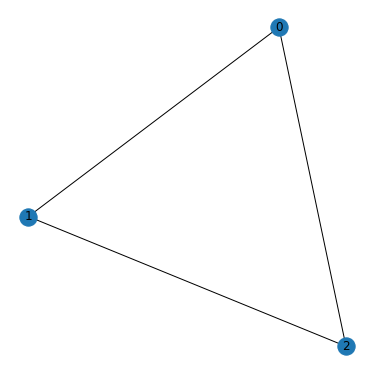

In [301]:
hvc1 = nx.complete_graph(3)

for (u,v,w) in hvc1.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(hvc1, with_labels=True, font_weights='bold')

#### QPU/CPU Hibrit ile Çözümleme

In [304]:
c_start = time.time()

hybrid_result_a = dnx.min_vertex_cover(hvc1, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("1. PROBLEM - QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

1. PROBLEM - QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  3676.800828933716


#### QPU ile Çözümleme

In [306]:
c_start = time.time()

qpu_result_a = dnx.min_vertex_cover(hvc1, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  4.501462697982788


#### CPU ile Çözümleme

In [307]:
c_start = time.time()

cpu_result_a = dnx.min_vertex_cover(hvc1, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("1. PROBLEM - CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

1. PROBLEM - CPU ÇÖZÜM SÜRESİ:  0.0014357566833496094


#### Çözümlerin Karşılaştırılması

In [312]:
print("QPU/CPU HİBRİT SONUÇ: ", hybrid_result_a)
print("QPU SONUÇ: ", qpu_result_a)
print("CPU SONUÇ: ", cpu_result_a)

QPU/CPU HİBRİT SONUÇ:  [0, 1]
QPU SONUÇ:  [1, 2]
CPU SONUÇ:  [1, 2]


### Graph Coloring Problemi

#### Problem

/Users/egedursun/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


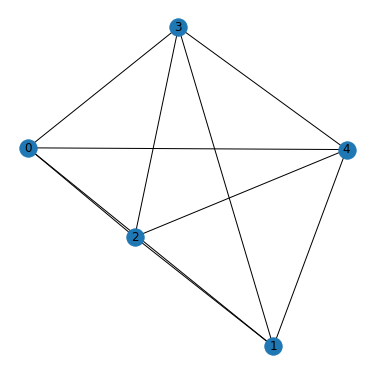

In [331]:
hymc = nx.complete_graph(5)

for (u,v,w) in hymc.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(hymc, with_labels=True, font_weights='bold')

#### QPU/CPU Hibrit ile Çözümleme

In [332]:
c_start = time.time()

hybrid_result_a = dnx.min_vertex_coloring(hymc, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  14.24190092086792


#### QPU ile Çözümleme

In [333]:
c_start = time.time()

qpu_result_a = dnx.min_vertex_coloring(hymc, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

QPU ÇÖZÜM SÜRESİ:  5.506086111068726


#### CPU ile Çözümleme

In [334]:
c_start = time.time()

cpu_result_a = dnx.min_vertex_coloring(hymc, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

CPU ÇÖZÜM SÜRESİ:  123.29105687141418


#### Çözümlerin Karşılaştırılması

In [335]:
print("QPU/CPU HİBRİT SONUÇ: ", hybrid_result_a)
print("QPU SONUÇ: ", qpu_result_a)
print("CPU SONUÇ: ", cpu_result_a)

QPU/CPU HİBRİT SONUÇ:  {0: 4, 1: 0, 2: 1, 3: 3, 4: 2}
QPU SONUÇ:  {0: 2, 1: 0, 2: 4, 4: 3}
CPU SONUÇ:  {0: 3, 1: 4, 2: 1, 3: 2, 4: 0}


### Maximum Clique Problemi

#### Problem

/Users/egedursun/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


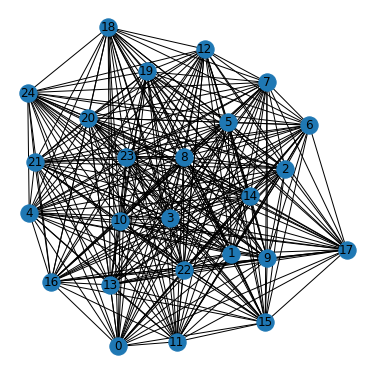

In [345]:
hymax = nx.complete_graph(25)

for (u,v,w) in hymax.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(hymax, with_labels=True, font_weights='bold')

#### QPU/CPU Hibrit ile Çözümleme

In [346]:
c_start = time.time()

hybrid_result_a = dnx.maximum_clique(hymax, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  14.414310216903687


#### QPU ile Çözümleme

In [347]:
c_start = time.time()

qpu_result_a = dnx.maximum_clique(hymax, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

QPU ÇÖZÜM SÜRESİ:  3.5077292919158936


#### CPU ile Çözümleme

In [349]:
c_start = time.time()

cpu_result_a = dnx.maximum_clique(hymax, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

CPU ÇÖZÜM SÜRESİ:  65.40786409378052


#### Çözümlerin Karşılaştırılması

In [350]:
print("QPU/CPU HİBRİT SONUÇ: ", hybrid_result_a)
print("QPU SONUÇ: ", qpu_result_a)
print("CPU SONUÇ: ", cpu_result_a)

QPU/CPU HİBRİT SONUÇ:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
QPU SONUÇ:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]
CPU SONUÇ:  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]


### Minimum Maximal Matching Problemi

#### Problem

/Users/egedursun/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


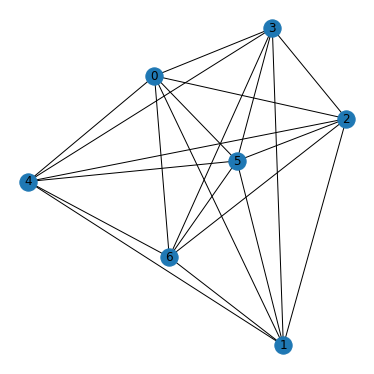

In [355]:
hymin = nx.complete_graph(7)

for (u,v,w) in hymin.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(hymin, with_labels=True, font_weights='bold')

#### QPU/CPU Hibrit ile Çözümleme

In [356]:
c_start = time.time()

hybrid_result_a = dnx.min_maximal_matching(hymin, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  14.226783990859985


#### QPU ile Çözümleme

In [357]:
c_start = time.time()

qpu_result_a = dnx.min_maximal_matching(hymin, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

QPU ÇÖZÜM SÜRESİ:  5.954056978225708


#### CPU ile Çözümleme

In [358]:
c_start = time.time()

cpu_result_a = dnx.min_maximal_matching(hymin, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

CPU ÇÖZÜM SÜRESİ:  7.748928070068359


#### Çözümlerin Karşılaştırılması

In [359]:
print("QPU/+
      -CPU HİBRİT SONUÇ: ", hybrid_result_a)
print("QPU SONUÇ: ", qpu_result_a)
print("CPU SONUÇ: ", cpu_result_a)

QPU/CPU HİBRİT SONUÇ:  {(4, 5), (2, 6), (1, 3)}
QPU SONUÇ:  {(1, 2), (4, 5), (1, 6), (2, 3), (0, 4), (2, 5), (3, 4)}
CPU SONUÇ:  {(1, 5), (4, 6), (0, 2)}


### Maximum Cut Problemi

#### Problem

/Users/egedursun/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


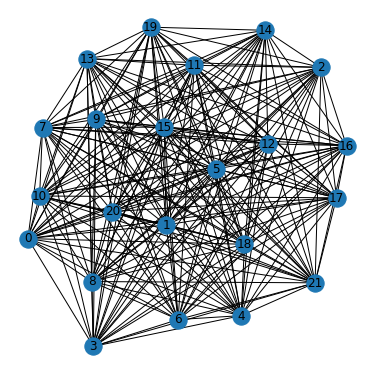

In [376]:
hymcut = nx.complete_graph(22)

for (u,v,w) in hymcut.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(hymcut, with_labels=True, font_weights='bold')

#### QPU/CPU Hibrit ile Çözümleme

In [377]:
c_start = time.time()

hybrid_result_a = dnx.maximum_cut(hymcut, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  15.238375902175903


#### QPU ile Çözümleme

In [378]:
c_start = time.time()

qpu_result_a = dnx.maximum_cut(hymcut, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

QPU ÇÖZÜM SÜRESİ:  8.182854175567627


#### CPU ile Çözümleme

In [379]:
c_start = time.time()

cpu_result_a = dnx.maximum_cut(hymcut, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

CPU ÇÖZÜM SÜRESİ:  27.116833925247192


#### Çözümlerin Karşılaştırılması

In [380]:
print("QPU/CPU HİBRİT SONUÇ: ", hybrid_result_a)
print("QPU SONUÇ: ", qpu_result_a)
print("CPU SONUÇ: ", cpu_result_a)

QPU/CPU HİBRİT SONUÇ:  {4, 5, 7, 8, 9, 10, 13, 14, 15, 16, 21}
QPU SONUÇ:  {5, 7, 9, 11, 12, 13, 15, 17, 18, 20, 21}
CPU SONUÇ:  {1, 2, 5, 6, 8, 10, 11, 12, 16, 17, 20}


### Traveling Salesperson Problemi

#### Problem

/Users/egedursun/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


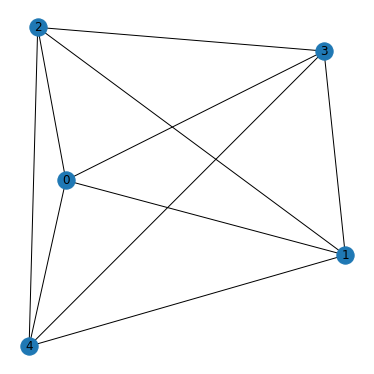

In [384]:
hysp = nx.complete_graph(5)

for (u,v,w) in hysp.edges(data=True):
    w['weight'] = random.randint(0,20)

plt.figure(figsize=(5,5))
nx.draw(hysp, with_labels=True, font_weights='bold')

#### QPU/CPU Hibrit ile Çözümleme

In [383]:
c_start = time.time()

hybrid_result_a = dnx.traveling_salesperson(hysp, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  16.50662088394165


#### QPU ile Çözümleme

In [385]:
c_start = time.time()

qpu_result_a = dnx.traveling_salesperson(hysp, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

QPU ÇÖZÜM SÜRESİ:  9.78623914718628


#### CPU ile Çözümleme

In [386]:
c_start = time.time()

cpu_result_a = dnx.traveling_salesperson(hysp, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

CPU ÇÖZÜM SÜRESİ:  185.0526249408722


#### Çözümlerin Karşılaştırılması

In [387]:
print("QPU/CPU HİBRİT SONUÇ: ", hybrid_result_a)
print("QPU SONUÇ: ", qpu_result_a)
print("CPU SONUÇ: ", cpu_result_a)

QPU/CPU HİBRİT SONUÇ:  [2, 9, 5, 7, 6, 0, 1, 3, 8, 4]
QPU SONUÇ:  [3, 2, 3, 1, 4]
CPU SONUÇ:  [2, 1, 0, 3, 4]


### Structural Imbalance Problemi

#### Problem

In [395]:
hysim = nx.complete_graph(20)
hysim.add_edges_from([(u, v, {'sign': 2*random.randint(0, 1) - 1}) for u, v in hysim.edges])

nx.relabel_nodes(hysim, 
                 {0: 'Ayse', 1: 'Baris', 2: 'Ceren', 3: 'Deniz', 4:'Eda', 5:'Fahrettin', 6:'Gaye',
                 7:'Halil', 8:'Idil', 9:'Jale', 10:'Kadir', 11:'Lale', 12:'Melis', 13:'Nedim',
                 14:'Onur', 15:'Pelin', 16:'Rasim', 17:'Selin', 18:'Tekin', 19:'Ulvi'}, 
                 copy=False)

print('Pozitif (Arkadaşcıl) İlişkiler: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y, sign) in hysim.edges(data='sign') if (sign == 1))))
print('Negatif (Düşmancıl) İlişkiler: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y, sign) in hysim.edges(data='sign') if (sign == -1))))

Pozitif (Arkadaşcıl) İlişkiler: 
	Ayse & Baris
	Ayse & Deniz
	Ayse & Halil
	Ayse & Jale
	Ayse & Kadir
	Ayse & Lale
	Ayse & Melis
	Ayse & Onur
	Ayse & Selin
	Baris & Gaye
	Baris & Jale
	Baris & Kadir
	Baris & Nedim
	Baris & Pelin
	Baris & Tekin
	Baris & Ulvi
	Ceren & Deniz
	Ceren & Fahrettin
	Ceren & Halil
	Ceren & Idil
	Ceren & Jale
	Ceren & Kadir
	Ceren & Nedim
	Ceren & Onur
	Ceren & Pelin
	Ceren & Selin
	Ceren & Tekin
	Ceren & Ulvi
	Deniz & Eda
	Deniz & Gaye
	Deniz & Halil
	Deniz & Jale
	Deniz & Lale
	Deniz & Melis
	Deniz & Nedim
	Deniz & Pelin
	Deniz & Tekin
	Deniz & Ulvi
	Eda & Fahrettin
	Eda & Halil
	Eda & Lale
	Eda & Melis
	Eda & Onur
	Eda & Pelin
	Eda & Ulvi
	Fahrettin & Halil
	Fahrettin & Jale
	Fahrettin & Melis
	Fahrettin & Nedim
	Fahrettin & Rasim
	Fahrettin & Selin
	Fahrettin & Ulvi
	Gaye & Melis
	Gaye & Nedim
	Gaye & Selin
	Halil & Idil
	Halil & Lale
	Halil & Melis
	Halil & Pelin
	Halil & Rasim
	Idil & Kadir
	Idil & Lale
	Idil & Nedim
	Idil & Tekin
	Idil & Ulvi
	Jale & Meli

/Users/egedursun/opt/anaconda3/lib/python3.7/site-packages/networkx/drawing/nx_pylab.py:579: MatplotlibDeprecationWarning: 
The iterable function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use np.iterable instead.
  if not cb.iterable(width):


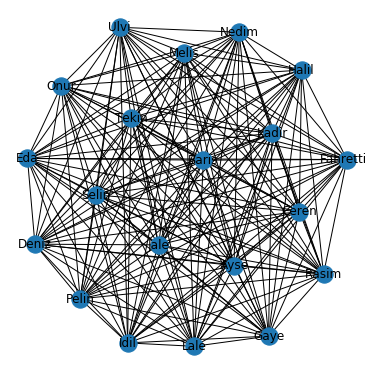

In [396]:
plt.figure(figsize=(5,5))
nx.draw(hysim, with_labels=True, font_weights='bold')

#### QPU/CPU Hibrit ile Çözümleme

In [397]:
c_start = time.time()

hybrid_imbalance_a, hybrid_bicoloring_a = dnx.structural_imbalance(hysim, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  14.653132200241089


#### QPU ile Çözümleme

In [398]:
c_start = time.time()

qpu_imbalance_a, qpu_bicoloring_a = dnx.structural_imbalance(hysim, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

QPU ÇÖZÜM SÜRESİ:  5.697700262069702


#### CPU ile Çözümleme

In [399]:
c_start = time.time()

cpu_imbalance_a, cpu_bicoloring_a = dnx.structural_imbalance(hysim, cpu_sampler)

c_end = time.time()

cpu_result_time = (c_end - c_start)

print("CPU ÇÖZÜM SÜRESİ: ", cpu_result_time)

CPU ÇÖZÜM SÜRESİ:  3.2858550548553467


#### Çözümlerin Karşılaştırılması

In [401]:
for edge in hysim.edges:
    hysim.edges[edge]['frustrated'] = edge in hybrid_imbalance_a
for node in hysim.nodes:
    hysim.nodes[node]['color'] = hybrid_bicoloring_a[node]

print("PROBLEM (QPU/CPU):")
print('GRUP A: \n\t' + '\n\t'.join(
    list(person for (person, color) in hybrid_bicoloring_a.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(
    list(person for (person, color) in hybrid_bicoloring_a.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(
    list(x + " & " + y for (x, y) in hybrid_imbalance_a.keys())))

PROBLEM (QPU/CPU):
GRUP A: 
	Baris
	Gaye
	Idil
	Kadir
	Lale
	Nedim
	Tekin
GRUP B: 
	Ayse
	Ceren
	Deniz
	Eda
	Fahrettin
	Halil
	Jale
	Melis
	Onur
	Pelin
	Rasim
	Selin
	Ulvi
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Baris
	Ayse & Ceren
	Ayse & Eda
	Ayse & Fahrettin
	Ayse & Kadir
	Ayse & Lale
	Ayse & Pelin
	Ayse & Rasim
	Ayse & Ulvi
	Baris & Idil
	Baris & Jale
	Baris & Lale
	Baris & Pelin
	Baris & Ulvi
	Ceren & Eda
	Ceren & Idil
	Ceren & Kadir
	Ceren & Melis
	Ceren & Nedim
	Ceren & Rasim
	Ceren & Tekin
	Deniz & Fahrettin
	Deniz & Gaye
	Deniz & Lale
	Deniz & Nedim
	Deniz & Onur
	Deniz & Rasim
	Deniz & Selin
	Deniz & Tekin
	Eda & Jale
	Eda & Lale
	Eda & Rasim
	Eda & Selin
	Fahrettin & Nedim
	Fahrettin & Onur
	Fahrettin & Pelin
	Gaye & Idil
	Gaye & Kadir
	Gaye & Lale
	Gaye & Melis
	Gaye & Selin
	Gaye & Tekin
	Halil & Idil
	Halil & Jale
	Halil & Lale
	Halil & Onur
	Halil & Selin
	Halil & Ulvi
	Idil & Ulvi
	Jale & Nedim
	Jale & Pelin
	Jale & Rasim
	Jale & Tekin
	Kadir & Nedim
	Kadir & Pelin
	Kadir

In [403]:
for edge in hysim.edges:
    hysim.edges[edge]['frustrated'] = edge in qpu_imbalance_a
for node in hysim.nodes:
    hysim.nodes[node]['color'] = qpu_bicoloring_a[node]

print("PROBLEM (QPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_a.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_a.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in qpu_imbalance_a.keys())))

PROBLEM (QPU):
GRUP A: 
	Eda
	Halil
	Idil
	Kadir
	Lale
	Onur
	Pelin
	Rasim
GRUP B: 
	Ayse
	Baris
	Ceren
	Deniz
	Fahrettin
	Gaye
	Jale
	Melis
	Nedim
	Selin
	Tekin
	Ulvi
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Ceren
	Ayse & Fahrettin
	Ayse & Gaye
	Ayse & Halil
	Ayse & Kadir
	Ayse & Lale
	Ayse & Nedim
	Ayse & Onur
	Ayse & Tekin
	Ayse & Ulvi
	Baris & Ceren
	Baris & Deniz
	Baris & Fahrettin
	Baris & Kadir
	Baris & Melis
	Baris & Pelin
	Baris & Selin
	Ceren & Gaye
	Ceren & Halil
	Ceren & Idil
	Ceren & Kadir
	Ceren & Melis
	Ceren & Onur
	Ceren & Pelin
	Deniz & Eda
	Deniz & Fahrettin
	Deniz & Halil
	Deniz & Lale
	Deniz & Pelin
	Deniz & Selin
	Eda & Fahrettin
	Eda & Idil
	Eda & Kadir
	Eda & Melis
	Eda & Rasim
	Eda & Ulvi
	Fahrettin & Gaye
	Fahrettin & Halil
	Fahrettin & Rasim
	Fahrettin & Tekin
	Gaye & Jale
	Gaye & Tekin
	Gaye & Ulvi
	Halil & Kadir
	Halil & Melis
	Halil & Onur
	Idil & Nedim
	Idil & Onur
	Idil & Pelin
	Idil & Rasim
	Idil & Tekin
	Idil & Ulvi
	Jale & Onur
	Kadir & Onur
	Kadir & Ras

In [404]:
for edge in hysim.edges:
    hysim.edges[edge]['frustrated'] = edge in cpu_imbalance_a
for node in hysim.nodes:
    hysim.nodes[node]['color'] = cpu_bicoloring_a[node]

print("PROBLEM (CPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in cpu_bicoloring_a.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in cpu_bicoloring_a.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in cpu_imbalance_a.keys())))

PROBLEM (CPU):
GRUP A: 
	Ayse
	Baris
	Gaye
	Idil
	Kadir
	Lale
	Nedim
GRUP B: 
	Ceren
	Deniz
	Eda
	Fahrettin
	Halil
	Jale
	Melis
	Onur
	Pelin
	Rasim
	Selin
	Tekin
	Ulvi
DENGESİZ/İNSTABİL İLİŞKİLER: 
	Ayse & Deniz
	Ayse & Gaye
	Ayse & Halil
	Ayse & Idil
	Ayse & Jale
	Ayse & Melis
	Ayse & Nedim
	Ayse & Onur
	Ayse & Selin
	Baris & Idil
	Baris & Jale
	Baris & Lale
	Baris & Pelin
	Baris & Tekin
	Baris & Ulvi
	Ceren & Eda
	Ceren & Idil
	Ceren & Kadir
	Ceren & Melis
	Ceren & Nedim
	Ceren & Rasim
	Deniz & Fahrettin
	Deniz & Gaye
	Deniz & Lale
	Deniz & Nedim
	Deniz & Onur
	Deniz & Rasim
	Deniz & Selin
	Eda & Jale
	Eda & Lale
	Eda & Rasim
	Eda & Selin
	Eda & Tekin
	Fahrettin & Nedim
	Fahrettin & Onur
	Fahrettin & Pelin
	Fahrettin & Tekin
	Gaye & Idil
	Gaye & Kadir
	Gaye & Lale
	Gaye & Melis
	Gaye & Selin
	Halil & Idil
	Halil & Jale
	Halil & Lale
	Halil & Onur
	Halil & Selin
	Halil & Tekin
	Halil & Ulvi
	Idil & Tekin
	Idil & Ulvi
	Jale & Nedim
	Jale & Pelin
	Jale & Rasim
	Kadir & Nedim
	Kadir & Pe

## Yapısal Dengesizlik Problemlerinin Çözümlenmesi

Bu bölümde NetworkX kütüphanesi kullanılarak yaratılan çeşitli çizgeler üzerinden, büyük boyutlu ve gerçek dünyada karşılaşılma olanağı olan yapısal dengesizlik problemlerine D-Wave QPU/CPU Hibriti ve QPU kullanarak çözümler getirmeye çalışacak ve performanslarını kaydedeceğiz.

In [415]:
import string

### 1. Problem

In [582]:
si1 = nx.complete_graph(35)
si1.add_edges_from([(u, v, {'sign': 2*random.randint(0, 1) - 1}) for u, v in si1.edges])

people = {}

for i in range(0, 35):
    
    people[i] = ''.join(random.choice(string.ascii_uppercase) for _ in range(8))

nx.relabel_nodes(si1, 
                 people, 
                 copy=False)

#print('Pozitif (Arkadaşcıl) İlişkiler: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y, sign) in si1.edges(data='sign') if (sign == 1))))
#print('Negatif (Düşmancıl) İlişkiler: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y, sign) in si1.edges(data='sign') if (sign == -1))))

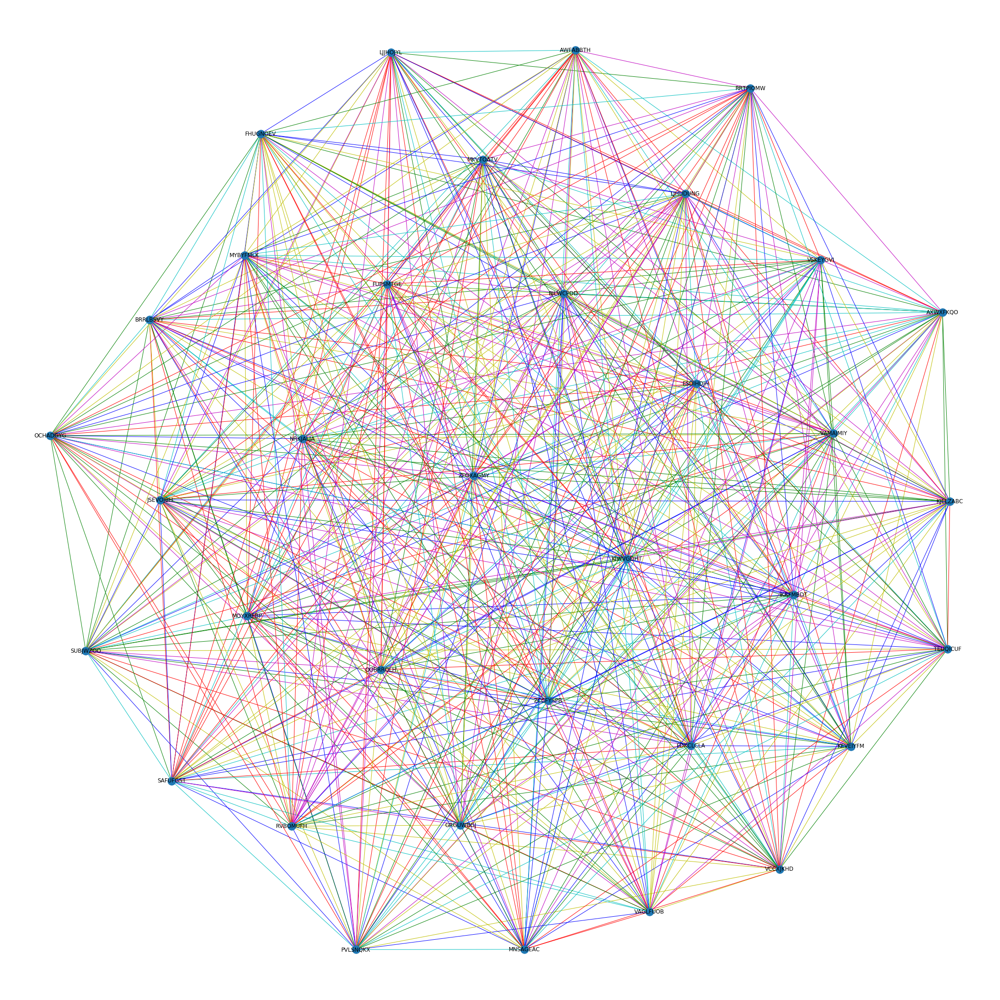

In [583]:
plt.figure(figsize=(30,30))

l = ["r", "g", "b", "y", "c", "m"]

colors = []
for i in range(0, len(si1.edges)):
    colors.append(random.choice(l))
    colors
    
nx.draw(si1, with_labels=True, edge_color=tuple(colors), font_weights='bold')

### 2. Problem

In [578]:
si2 = nx.complete_graph(20)
si2.add_edges_from([(u, v, {'sign': 2*random.randint(0, 1) - 1}) for u, v in si2.edges])

people = {}

for i in range(0, 20):
    
    people[i] = ''.join(random.choice(string.ascii_uppercase) for _ in range(8))

nx.relabel_nodes(si2, 
                 people, 
                 copy=False)

#print('Pozitif (Arkadaşcıl) İlişkiler: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y, sign) in si1.edges(data='sign') if (sign == 1))))
#print('Negatif (Düşmancıl) İlişkiler: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y, sign) in si1.edges(data='sign') if (sign == -1))))

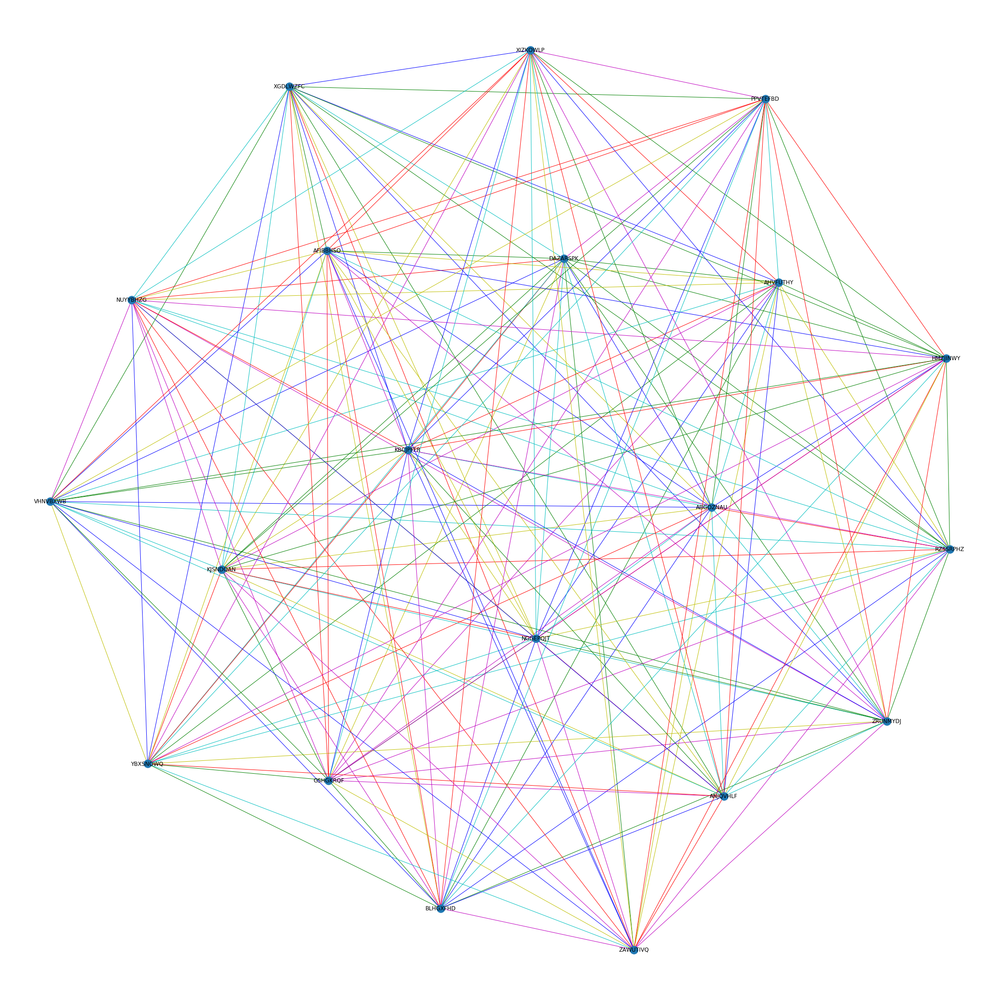

In [579]:
plt.figure(figsize=(30,30))

l = ["r", "g", "b", "y", "c", "m"]

colors = []
for i in range(0, len(si2.edges)):
    colors.append(random.choice(l))
    colors
    
nx.draw(si2, with_labels=True, edge_color=tuple(colors), font_weights='bold')

### 3. Problem

In [580]:
si3 = nx.complete_graph(30)
si3.add_edges_from([(u, v, {'sign': 2*random.randint(0, 1) - 1}) for u, v in si3.edges])

people = {}

for i in range(0, 30):
    
    people[i] = ''.join(random.choice(string.ascii_uppercase) for _ in range(8))

nx.relabel_nodes(si3, 
                 people, 
                 copy=False)

#print('Pozitif (Arkadaşcıl) İlişkiler: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y, sign) in si1.edges(data='sign') if (sign == 1))))
#print('Negatif (Düşmancıl) İlişkiler: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y, sign) in si1.edges(data='sign') if (sign == -1))))

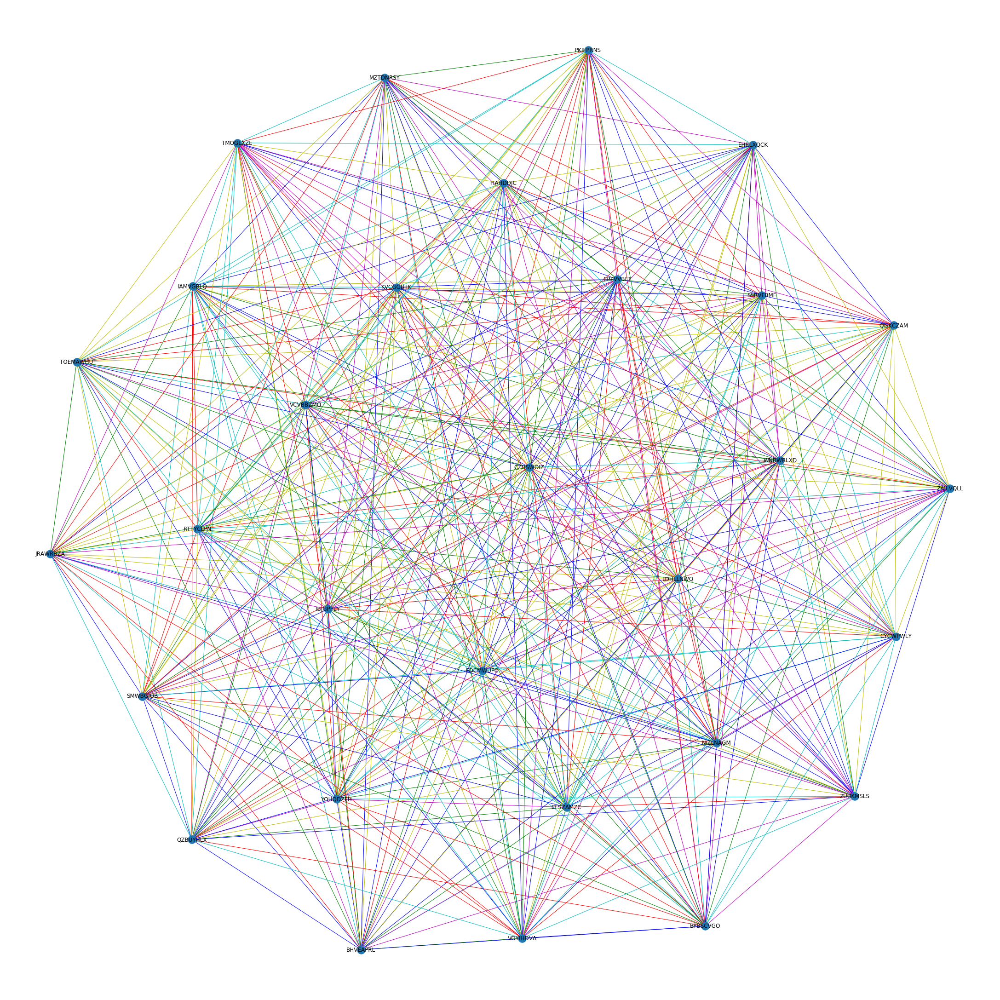

In [581]:
plt.figure(figsize=(30,30))

l = ["r", "g", "b", "y", "c", "m"]

colors = []
for i in range(0, len(si3.edges)):
    colors.append(random.choice(l))
    colors
    
nx.draw(si3, with_labels=True, edge_color=tuple(colors), font_weights='bold')

### QPU ile Çözümleme

#### Problem 1

In [584]:
c_start = time.time()

qpu_imbalance_a, qpu_bicoloring_a = dnx.structural_imbalance(si1, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("1. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

1. PROBLEM - QPU ÇÖZÜM SÜRESİ:  11.170470237731934


#### Problem 2

In [587]:
c_start = time.time()

qpu_imbalance_b, qpu_bicoloring_b = dnx.structural_imbalance(si2, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("2. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

2. PROBLEM - QPU ÇÖZÜM SÜRESİ:  5.7992589473724365


#### Problem 3

In [588]:
c_start = time.time()

qpu_imbalance_c, qpu_bicoloring_c = dnx.structural_imbalance(si3, qpu_sampler)

c_end = time.time()

qpu_result_time = (c_end - c_start)

print("3. PROBLEM - QPU ÇÖZÜM SÜRESİ: ", qpu_result_time)

3. PROBLEM - QPU ÇÖZÜM SÜRESİ:  7.823553085327148


### QPU/CPU Hibrit ile Çözümleme

#### Problem 1

In [589]:
c_start = time.time()

hybrid_imbalance_a, hybrid_bicoloring_a = dnx.structural_imbalance(si1, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("1. PROBLEM - QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

1. PROBLEM - QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  11.206799030303955


#### Problem 2

In [590]:
c_start = time.time()

hybrid_imbalance_b, hybrid_bicoloring_b = dnx.structural_imbalance(si2, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("2. PROBLEM - QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

2. PROBLEM - QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  15.674062252044678


#### Problem 3

In [591]:
c_start = time.time()

hybrid_imbalance_c, hybrid_bicoloring_c = dnx.structural_imbalance(si3, hybrid_sampler)

c_end = time.time()

hybrid_result_time = (c_end - c_start)

print("3. PROBLEM - QPU/CPU HİBRİT ÇÖZÜM SÜRESİ: ", hybrid_result_time)

3. PROBLEM - QPU/CPU HİBRİT ÇÖZÜM SÜRESİ:  16.554741144180298


#### Çözümlerin Karşılaştırılması

#### 1. Problem

In [592]:
for edge in si1.edges:
    si1.edges[edge]['frustrated'] = edge in qpu_imbalance_a
for node in si1.nodes:
    si1.nodes[node]['color'] = qpu_bicoloring_a[node]

print("1. PROBLEM (QPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_a.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_a.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in qpu_imbalance_a.keys())))

1. PROBLEM (QPU):
GRUP A: 
	EDKCLCLA
	ESDIHDJH
	FUPSMTGE
	GRGUWBGJ
	IKRFMBDT
	JSEVOJBH
	KEVEIYFM
	KIWVGDHT
	LJHUDUNG
	LJJHOJYL
	MNSAGEAC
	MYBYFMLK
	RRTPIOMW
	SUBJWZOO
	TEUQICUF
	VSKEYGVI
	ZCCFYSPB
	ZFOXAGMY
GRUP B: 
	AWFABBTH
	AXWXFKQO
	BILWCPDD
	BRRLBSVY
	FHUGNOEV
	KJELZABC
	MKVTOATV
	MOYXRFBP
	NRKJALJA
	OCHADGYG
	PVLSNQKX
	QOBRRQLH
	RVBOMUFH
	SAFUFGST
	VAGLFUOB
	VAMAJMIY
	VCCXJKHD
DENGESİZ/İNSTABİL İLİŞKİLER: 
	MOYXRFBP & AXWXFKQO
	MOYXRFBP & SUBJWZOO
	MOYXRFBP & ESDIHDJH
	MOYXRFBP & BRRLBSVY
	MOYXRFBP & LJJHOJYL
	MOYXRFBP & AWFABBTH
	MOYXRFBP & MKVTOATV
	MOYXRFBP & EDKCLCLA
	MOYXRFBP & TEUQICUF
	MOYXRFBP & GRGUWBGJ
	MOYXRFBP & OCHADGYG
	MOYXRFBP & JSEVOJBH
	MOYXRFBP & VAGLFUOB
	MOYXRFBP & FHUGNOEV
	MOYXRFBP & FUPSMTGE
	MOYXRFBP & KIWVGDHT
	MOYXRFBP & MNSAGEAC
	MOYXRFBP & MYBYFMLK
	MOYXRFBP & LJHUDUNG
	MOYXRFBP & VSKEYGVI
	MOYXRFBP & ZFOXAGMY
	MOYXRFBP & ZCCFYSPB
	AXWXFKQO & BRRLBSVY
	AXWXFKQO & BILWCPDD
	AXWXFKQO & SAFUFGST
	AXWXFKQO & KEVEIYFM
	AXWXFKQO & LJJHOJYL
	AXWXFKQO & NRKJA

In [595]:
for edge in si1.edges:
    si1.edges[edge]['frustrated'] = edge in hybrid_imbalance_a
for node in si1.nodes:
    si1.nodes[node]['color'] = hybrid_bicoloring_a[node]

print("1. PROBLEM (QPU/CPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in hybrid_bicoloring_a.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in hybrid_bicoloring_a.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in hybrid_imbalance_a.keys())))

1. PROBLEM (QPU/CPU):
GRUP A: 
	AWFABBTH
	BRRLBSVY
	EDKCLCLA
	ESDIHDJH
	FHUGNOEV
	GRGUWBGJ
	KEVEIYFM
	KIWVGDHT
	LJHUDUNG
	MKVTOATV
	MYBYFMLK
	NRKJALJA
	OCHADGYG
	SUBJWZOO
	TEUQICUF
	ZCCFYSPB
GRUP B: 
	AXWXFKQO
	BILWCPDD
	FUPSMTGE
	IKRFMBDT
	JSEVOJBH
	KJELZABC
	LJJHOJYL
	MNSAGEAC
	MOYXRFBP
	PVLSNQKX
	QOBRRQLH
	RRTPIOMW
	RVBOMUFH
	SAFUFGST
	VAGLFUOB
	VAMAJMIY
	VCCXJKHD
	VSKEYGVI
	ZFOXAGMY
DENGESİZ/İNSTABİL İLİŞKİLER: 
	MOYXRFBP & AXWXFKQO
	MOYXRFBP & SUBJWZOO
	MOYXRFBP & ESDIHDJH
	MOYXRFBP & NRKJALJA
	MOYXRFBP & EDKCLCLA
	MOYXRFBP & TEUQICUF
	MOYXRFBP & GRGUWBGJ
	MOYXRFBP & IKRFMBDT
	MOYXRFBP & VAGLFUOB
	MOYXRFBP & KIWVGDHT
	MOYXRFBP & MYBYFMLK
	MOYXRFBP & LJHUDUNG
	MOYXRFBP & RRTPIOMW
	MOYXRFBP & ZCCFYSPB
	AXWXFKQO & BILWCPDD
	AXWXFKQO & SAFUFGST
	AXWXFKQO & KEVEIYFM
	AXWXFKQO & AWFABBTH
	AXWXFKQO & VAMAJMIY
	AXWXFKQO & EDKCLCLA
	AXWXFKQO & GRGUWBGJ
	AXWXFKQO & FHUGNOEV
	AXWXFKQO & MNSAGEAC
	AXWXFKQO & VSKEYGVI
	AXWXFKQO & ZFOXAGMY
	AXWXFKQO & RVBOMUFH
	SUBJWZOO & SAFUFGST
	SUBJWZOO & N

#### 2. Problem

In [594]:
for edge in si2.edges:
    si2.edges[edge]['frustrated'] = edge in qpu_imbalance_b
for node in si2.nodes:
    si2.nodes[node]['color'] = qpu_bicoloring_b[node]

print("2. PROBLEM (QPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_b.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_b.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in qpu_imbalance_b.keys())))

2. PROBLEM (QPU):
GRUP A: 
	AFIBBHSO
	AHVFUTHY
	ANJQVHLF
	DAZARSPK
	GSHGKRQF
	NGGEPQJT
	NUYYBHZG
	VHNVBXWB
	YBXSNOWQ
GRUP B: 
	ABGOZNAU
	BLHGXFHD
	HMZJINWY
	KBCJPFFR
	KJSNDQAN
	PPVTEFBD
	RZSSRPHZ
	XGDLWZFC
	XIZKOWLP
	ZAWUTIVQ
	ZRUNMYDJ
DENGESİZ/İNSTABİL İLİŞKİLER: 
	XGDLWZFC & DAZARSPK
	XGDLWZFC & AHVFUTHY
	XGDLWZFC & ZRUNMYDJ
	XGDLWZFC & KJSNDQAN
	XGDLWZFC & AFIBBHSO
	XGDLWZFC & BLHGXFHD
	XGDLWZFC & NUYYBHZG
	XGDLWZFC & YBXSNOWQ
	XGDLWZFC & XIZKOWLP
	XGDLWZFC & ZAWUTIVQ
	XGDLWZFC & HMZJINWY
	XGDLWZFC & VHNVBXWB
	DAZARSPK & AHVFUTHY
	DAZARSPK & ABGOZNAU
	DAZARSPK & NGGEPQJT
	DAZARSPK & PPVTEFBD
	DAZARSPK & KBCJPFFR
	DAZARSPK & ANJQVHLF
	DAZARSPK & VHNVBXWB
	AHVFUTHY & ABGOZNAU
	AHVFUTHY & RZSSRPHZ
	AHVFUTHY & NGGEPQJT
	AHVFUTHY & AFIBBHSO
	AHVFUTHY & PPVTEFBD
	AHVFUTHY & BLHGXFHD
	AHVFUTHY & GSHGKRQF
	AHVFUTHY & ANJQVHLF
	AHVFUTHY & HMZJINWY
	ABGOZNAU & ZRUNMYDJ
	ABGOZNAU & KJSNDQAN
	ABGOZNAU & RZSSRPHZ
	ABGOZNAU & NGGEPQJT
	ABGOZNAU & BLHGXFHD
	ABGOZNAU & ANJQVHLF
	ZRUNMYDJ & NGGEPQJT

In [597]:
for edge in si2.edges:
    si2.edges[edge]['frustrated'] = edge in hybrid_imbalance_b
for node in si2.nodes:
    si2.nodes[node]['color'] = hybrid_bicoloring_b[node]

print("2. PROBLEM (QPU/CPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in hybrid_bicoloring_b.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in hybrid_bicoloring_b.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in hybrid_imbalance_b.keys())))

2. PROBLEM (QPU/CPU):
GRUP A: 
	ABGOZNAU
	AHVFUTHY
	ANJQVHLF
	BLHGXFHD
	HMZJINWY
	KJSNDQAN
	NGGEPQJT
	PPVTEFBD
	RZSSRPHZ
	XIZKOWLP
	ZAWUTIVQ
GRUP B: 
	AFIBBHSO
	DAZARSPK
	GSHGKRQF
	KBCJPFFR
	NUYYBHZG
	VHNVBXWB
	XGDLWZFC
	YBXSNOWQ
	ZRUNMYDJ
DENGESİZ/İNSTABİL İLİŞKİLER: 
	XGDLWZFC & AHVFUTHY
	XGDLWZFC & ABGOZNAU
	XGDLWZFC & ZRUNMYDJ
	XGDLWZFC & RZSSRPHZ
	XGDLWZFC & PPVTEFBD
	XGDLWZFC & GSHGKRQF
	DAZARSPK & ABGOZNAU
	DAZARSPK & ZRUNMYDJ
	DAZARSPK & PPVTEFBD
	DAZARSPK & VHNVBXWB
	AHVFUTHY & KJSNDQAN
	AHVFUTHY & NGGEPQJT
	AHVFUTHY & NUYYBHZG
	AHVFUTHY & YBXSNOWQ
	AHVFUTHY & XIZKOWLP
	AHVFUTHY & ZAWUTIVQ
	AHVFUTHY & ANJQVHLF
	AHVFUTHY & VHNVBXWB
	ABGOZNAU & KJSNDQAN
	ABGOZNAU & RZSSRPHZ
	ABGOZNAU & BLHGXFHD
	ABGOZNAU & KBCJPFFR
	ZRUNMYDJ & KJSNDQAN
	ZRUNMYDJ & RZSSRPHZ
	ZRUNMYDJ & NGGEPQJT
	ZRUNMYDJ & KBCJPFFR
	ZRUNMYDJ & HMZJINWY
	ZRUNMYDJ & VHNVBXWB
	KJSNDQAN & RZSSRPHZ
	KJSNDQAN & PPVTEFBD
	KJSNDQAN & ANJQVHLF
	RZSSRPHZ & NGGEPQJT
	RZSSRPHZ & BLHGXFHD
	RZSSRPHZ & KBCJPFFR
	RZSSRPHZ & XIZK

#### 3. Problem

In [598]:
for edge in si3.edges:
    si3.edges[edge]['frustrated'] = edge in qpu_imbalance_c
for node in si3.nodes:
    si3.nodes[node]['color'] = qpu_bicoloring_c[node]

print("3. PROBLEM (QPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_c.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in qpu_bicoloring_c.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in qpu_imbalance_c.keys())))

3. PROBLEM (QPU):
GRUP A: 
	BHVEAPRL
	CYCWPWLY
	EDCMWUFO
	EHRLXQCK
	IAMVGBLQ
	IBJGPPLY
	MZTDNRSY
	QISKCZAM
	QZBUYHLX
	SSRVFBMF
	TOEMAWHU
	VCVBBZMO
	VOYIHDVA
	WNBWBLXD
	ZAJLVQLL
	ZUUKMSLS
GRUP B: 
	BPBSCVGO
	CFSZAMZC
	CPTVVBFT
	CZHSWOIZ
	FIAHDDJC
	JRAWRBZA
	KVCGGBTK
	LDHLLNWQ
	NIZLNAGM
	PKJFPRNS
	RTTYCLPN
	SMWBGJOB
	TMOGLXZE
	YOUQDZFH
DENGESİZ/İNSTABİL İLİŞKİLER: 
	LDHLLNWQ & MZTDNRSY
	LDHLLNWQ & KVCGGBTK
	LDHLLNWQ & TOEMAWHU
	LDHLLNWQ & QZBUYHLX
	LDHLLNWQ & SSRVFBMF
	LDHLLNWQ & CFSZAMZC
	LDHLLNWQ & IBJGPPLY
	LDHLLNWQ & ZAJLVQLL
	LDHLLNWQ & NIZLNAGM
	LDHLLNWQ & PKJFPRNS
	LDHLLNWQ & VOYIHDVA
	LDHLLNWQ & FIAHDDJC
	LDHLLNWQ & VCVBBZMO
	LDHLLNWQ & CZHSWOIZ
	LDHLLNWQ & JRAWRBZA
	LDHLLNWQ & ZUUKMSLS
	IAMVGBLQ & MZTDNRSY
	IAMVGBLQ & KVCGGBTK
	IAMVGBLQ & RTTYCLPN
	IAMVGBLQ & SSRVFBMF
	IAMVGBLQ & EDCMWUFO
	IAMVGBLQ & CYCWPWLY
	IAMVGBLQ & WNBWBLXD
	IAMVGBLQ & BPBSCVGO
	IAMVGBLQ & SMWBGJOB
	IAMVGBLQ & ZUUKMSLS
	QISKCZAM & MZTDNRSY
	QISKCZAM & KVCGGBTK
	QISKCZAM & TOEMAWHU
	QISKCZAM & QZBUYHLX
	QIS

In [599]:
for edge in si3.edges:
    si3.edges[edge]['frustrated'] = edge in hybrid_imbalance_c
for node in si3.nodes:
    si3.nodes[node]['color'] = hybrid_bicoloring_c[node]

print("3. PROBLEM (QPU/CPU):")
print('GRUP A: \n\t' + '\n\t'.join(list(person for (person, color) in hybrid_bicoloring_c.items() if (color == 0))))
print('GRUP B: \n\t' + '\n\t'.join(list(person for (person, color) in hybrid_bicoloring_c.items() if (color == 1))))
print('DENGESİZ/İNSTABİL İLİŞKİLER: \n\t' + '\n\t'.join(list(x + " & " + y for (x, y) in hybrid_imbalance_c.keys())))

3. PROBLEM (QPU/CPU):
GRUP A: 
	BPBSCVGO
	CFSZAMZC
	CYCWPWLY
	KVCGGBTK
	LDHLLNWQ
	NIZLNAGM
	PKJFPRNS
	QZBUYHLX
	RTTYCLPN
	SMWBGJOB
	SSRVFBMF
	TMOGLXZE
	TOEMAWHU
	VCVBBZMO
	WNBWBLXD
	YOUQDZFH
	ZUUKMSLS
GRUP B: 
	BHVEAPRL
	CPTVVBFT
	CZHSWOIZ
	EDCMWUFO
	EHRLXQCK
	FIAHDDJC
	IAMVGBLQ
	IBJGPPLY
	JRAWRBZA
	MZTDNRSY
	QISKCZAM
	VOYIHDVA
	ZAJLVQLL
DENGESİZ/İNSTABİL İLİŞKİLER: 
	LDHLLNWQ & MZTDNRSY
	LDHLLNWQ & KVCGGBTK
	LDHLLNWQ & CFSZAMZC
	LDHLLNWQ & CPTVVBFT
	LDHLLNWQ & IBJGPPLY
	LDHLLNWQ & ZAJLVQLL
	LDHLLNWQ & NIZLNAGM
	LDHLLNWQ & PKJFPRNS
	LDHLLNWQ & VOYIHDVA
	LDHLLNWQ & CYCWPWLY
	LDHLLNWQ & WNBWBLXD
	IAMVGBLQ & MZTDNRSY
	IAMVGBLQ & KVCGGBTK
	IAMVGBLQ & TOEMAWHU
	IAMVGBLQ & QZBUYHLX
	IAMVGBLQ & RTTYCLPN
	IAMVGBLQ & EDCMWUFO
	IAMVGBLQ & CPTVVBFT
	IAMVGBLQ & FIAHDDJC
	IAMVGBLQ & VCVBBZMO
	IAMVGBLQ & CZHSWOIZ
	IAMVGBLQ & JRAWRBZA
	IAMVGBLQ & BPBSCVGO
	IAMVGBLQ & SMWBGJOB
	QISKCZAM & MZTDNRSY
	QISKCZAM & KVCGGBTK
	QISKCZAM & SSRVFBMF
	QISKCZAM & NIZLNAGM
	QISKCZAM & PKJFPRNS
	QISKCZAM & CYCWPWLY
